# Sommaire :


### <a href="#C1"> **Partie 1 : Contexte et Objectifs**</a>

 - Contexte
 - Objectifs

<b><hr></b>

### <a href="#C2"> **Partie 2 : Mise en place de l'espace de travail**</a>
 - <a href="#C21"> 2.1 Import des packages</a>
 - <a href="#C22"> 2.2 Repertoire de travail</a>
 - <a href="#C23"> 2.3 Import des datas frames</a>

<b><hr></b>

### <a href="#C3"> **Partie 3 : Analyse exploratoire et etude des jeux de données EDA**</a>
 - <a href="#C31"> 3.1 Display </a>
 - <a href="#C32"> 3.2 Structure du dataframes </a>
 - <a href="#C33"> 3.3 Les valeurs manquantes et les doublons du dataframes </a>
 - <a href="#C34"> 3.4 Data inspections </a>
 - <a href="#C35"> 3.5 Data Visualisation Multivariée </a>
 - <a href="#C36"> 3.6 Normalité </a>
 - <a href="#C37"> 3.7 Multi Colinéarité </a>
    
<b><hr></b>
 
### <a href="#C4"> **Partie 4 : Cleaning**</a>
 - <a href="#C41"> 4.1 Imputer missing Values</a>
 - <a href="#C42"> 4.2 Encoding object colonnes (LabelEncoding/OrdinalEncoder/OneHotEncoding) </a>
 - <a href="#C43"> 4.3 Export csv</a>
 
<b><hr></b>

### <a href="#C5"> **Partie 5 : Conclusion**</a>


# <a name="C1">**Partie 1 : Contexte et Objectifs**</a> 

Contexte

Vous travaillez pour la ville de Seattle. 
Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, 
votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.

Des relevés minutieux ont été effectués par les agents de la ville en 2016. <br>
Voici la <a href = "https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy">source des données</a>. 

Objectifs

# <a name="C2"><font color='blue'>**Partie 2 : Mise en place de l'espace de travail**</font></a> 

### <a name="C21"><font color='blue'>2.1 Imports packages</font></a> 

###### <b><font color='blue'>2.1.0 Requirements</font></b>
- <b>Built-in</b>       : os, warnings
- <b>Data</b>           : pandas, numpy
- <b>Visualisations</b> : matplotlib, seaborn
- <b>Preprocessing</b>  : sklearn, scipy

###### <b><font color='blue'>2.1.1 Imports</font></b>

In [1]:
# Built-in
import os, warnings 

# Data
import numpy as np
import pandas as pd

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
#%matplotlib inline

# Imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer,KNNImputer,IterativeImputer

#Preprocessing
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder,StandardScaler,MinMaxScaler

#metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,accuracy_score

# feature selection
from sklearn.feature_selection import VarianceThreshold
from scipy.stats import entropy

### <a name="C22"><font color='blue'>2.2 Working directory</font></a> 

In [2]:
os.listdir()

['.git',
 '.gitignore',
 '.ipynb_checkpoints',
 '00_EDA P4.ipynb',
 '02_modelisation_consommation totale d’énergie.ipynb',
 '2016_Building_Energy_Benchmarking.csv',
 'Brouillon.ipynb',
 'Bullitt Center.png',
 'data',
 'ModeleCO2.ipynb',
 'rapport.html',
 'README.md']

In [3]:
os.listdir('data/source')

['2016_Building_Energy_Benchmarking.csv']

In [4]:
path = 'data/source/'
# A completer
filename = '2016_Building_Energy_Benchmarking.csv'

### <a name="C23"><font color='blue'>2.3 Import DataFrames</font></a> 

In [5]:
df = pd.read_csv(path+filename)

# <a name="C3"><font color='teal'>**Partie 3 : Analyse exploratoire et etude des jeux de données EDA**</font></a> 

### <a name="C31"><font color='teal'>3.1 Display</font></a>

In [6]:
df.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [7]:
df.sample(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2127,24542,2016,Multifamily LR (1-4),Low-Rise Multifamily,Point Shilshole Condominiums,6321 Seaview Avenue NW,Seattle,WA,98107.0,6837900000,...,219608.5000,749304.0,13655.55957,1365556.0,False,NaN,Compliant,NaN,77.75,2.07
1346,21569,2016,Multifamily LR (1-4),Low-Rise Multifamily,Pinehurst Apartments,11500 Pinehurst Wy NE,Seattle,WA,98125.0,2044500380,...,346729.8125,1183042.0,0.00000,0.0,False,NaN,Compliant,NaN,8.25,0.16
3331,50056,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Kebero Court,1105 E Fir St,Seattle,WA,98122.0,9826700260,...,623410.6250,2127077.0,0.00000,0.0,False,NaN,Compliant,NaN,14.83,0.12
1378,21663,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Evans House,415 - 10th Ave.,Seattle,WA,98122.0,2197600205,...,340958.8125,1163351.0,24782.68945,2478269.0,False,NaN,Compliant,NaN,139.73,2.67
1248,21341,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Cascade Court Apartments,1201 Summit Ave,Seattle,WA,98101.0,1978200790,...,587616.8750,2004949.0,17464.67969,1746468.0,False,NaN,Compliant,NaN,106.73,0.95


### <a name="C32"><font color='teal'>3.2 Structure du dataframe</font></a> 

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

##### Filtrage des colonnes selon la consigne

In [9]:
df.drop(columns=['SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 
       'NaturalGas(therms)', 'NaturalGas(kBtu)', 'GHGEmissionsIntensity'],
       inplace=True)

In [10]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier', 'TotalGHGEmissions'],
      dtype='object')

In [11]:
# Distribution des types de variables
df.dtypes.value_counts(normalize=False)

object     15
float64    12
int64       8
bool        1
dtype: int64

In [12]:
df.nunique()

OSEBuildingID                      3376
DataYear                              1
BuildingType                          8
PrimaryPropertyType                  24
PropertyName                       3362
Address                            3354
City                                  1
State                                 1
ZipCode                              55
TaxParcelIdentificationNumber      3268
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           2876
Longitude                          2656
YearBuilt                           113
NumberofBuildings                    17
NumberofFloors                       50
PropertyGFATotal                   3195
PropertyGFAParking                  496
PropertyGFABuilding(s)             3193
ListOfAllPropertyUseTypes           466
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          3122
SecondLargestPropertyUseType         50
SecondLargestPropertyUseTypeGFA    1352


### Drop Columns variance nulle ou faible

In [13]:
def drop_variance_null(data,v = 0):
    '''
    Select features whom std is less than v
    '''
    feature_to_drop = []
    
    if v == 0:
        v = 1.0e-10
    
    # Variables numeriques
    var0_num = data.std(numeric_only=True)<v
    for col in var0_num.index[var0_num]:
        feature_to_drop.append(col)
    
    # Variables non numeriques
    var0_cat = data.select_dtypes(exclude = np.number).nunique()==1
        
    for col in var0_cat.index[var0_cat]:
        feature_to_drop.append(col)
    
    return(feature_to_drop)

In [14]:
df.shape

(3376, 36)

In [15]:
col_to_drop = drop_variance_null(df)
col_to_drop

['DataYear', 'City', 'State']

In [16]:
#
df_cleaned = df.drop(columns=col_to_drop)

# Comment est toujour null
df_cleaned = df_cleaned.drop(columns='Comments')

In [17]:
df_cleaned.shape

(3376, 32)

### <a name="C33"><font color='teal'>3.3 Les valeurs manquantes et les doublons du dataframes</font></a> 

#### <font color='teal'>3.3.a Analyse des doublons du dataframes</font>

In [18]:
print("Il y a {} lignes dupliquées".format(df_cleaned.duplicated().sum()))

Il y a 0 lignes dupliquées


In [19]:
print("Il y a {} lignes dupliquées".format( df_cleaned.drop(columns="OSEBuildingID").duplicated().sum() ))
print("Il y a {} clés primaires dupliquées".format( df_cleaned["OSEBuildingID"].duplicated().sum() ))

Il y a 0 lignes dupliquées
Il y a 0 clés primaires dupliquées


In [20]:
# Modification de l'index du dataset
df_cleaned.set_index('OSEBuildingID',inplace=True)

In [21]:
df_cleaned.head(2)

,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,...,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,...,NaN,NaN,NaN,60.0,7226362.5,7456910.0,False,Compliant,NaN,249.98
2,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,...,Restaurant,4622.0,NaN,61.0,8387933.0,8664479.0,False,Compliant,NaN,295.86


#### <font color='teal'>3.3.b Analyse et Traitement des valeurs manquantes du dataframes</font>

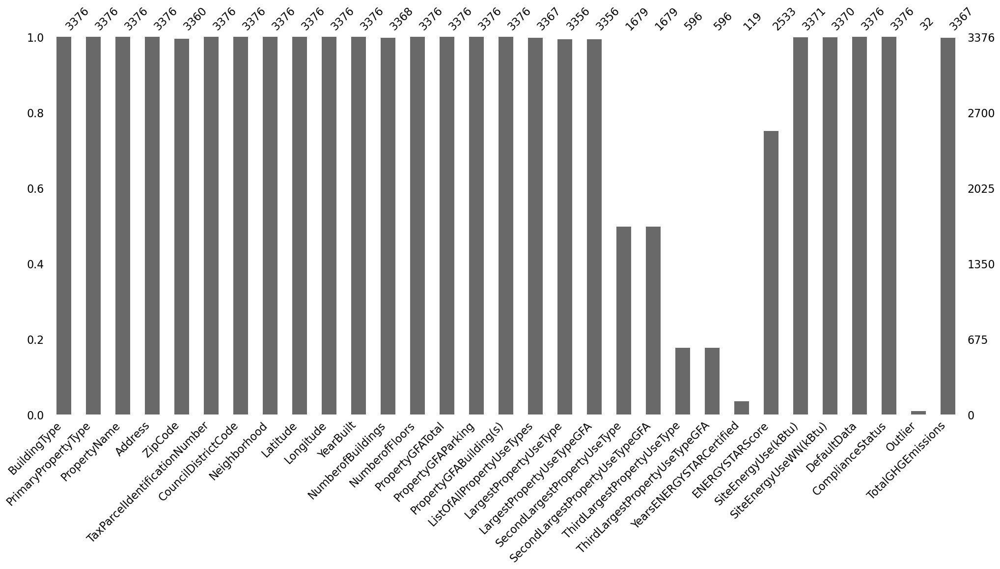

In [22]:
#les variables misc_data
import missingno as msno
msno.bar(df_cleaned);

#### les données manquantes des variables géographiques

###### ZipCode

In [23]:
# https://www.gps-coordinates.net/
# https://www.latlong.net/Show-Latitude-Longitude.html
# https://www.findlatitudeandlongitude.com/find-address-from-latitude-and-longitude/

df_cleaned.loc[df_cleaned.Address=='10510 5th Ave NE','ZipCode'] = 98125.0
df_cleaned.loc[df_cleaned.Address=='405 MLK Jr Way S','ZipCode'] = 98144.0
df_cleaned.loc[df_cleaned.Address=='8729 15th Ave NW','ZipCode'] = 98117.0
df_cleaned.loc[df_cleaned.Address=='2806 NE 127th St','ZipCode'] = 98125.0
df_cleaned.loc[df_cleaned.Address=='6020 28th ave NW','ZipCode'] = 98107.0
df_cleaned.loc[df_cleaned.Address=='1471 NW 67th St','ZipCode'] = 98117.0
df_cleaned.loc[df_cleaned.Address=='1403 w howe','ZipCode'] = 98119.0
df_cleaned.loc[df_cleaned.Address=='1400 E Galer St','ZipCode'] = 98112.0
df_cleaned.loc[df_cleaned.Address=='2323 East Cherry St','ZipCode'] = 98122.0
df_cleaned.loc[df_cleaned.Address=='4420 S Genesee','ZipCode'] = 98118.0
df_cleaned.loc[df_cleaned.Address=='6920 34th Ave SW','ZipCode'] = 98126.0
df_cleaned.loc[df_cleaned.Address=='1600 S Dakota St','ZipCode'] = 98108.0
df_cleaned.loc[df_cleaned.Address=='719 8th Ave S','ZipCode'] = 98114.0
df_cleaned.loc[df_cleaned.Address=='1920 1st Ave W','ZipCode'] = 98119.0
df_cleaned.loc[df_cleaned.Address=='8319 8th Ave S','ZipCode'] = 98108.0
df_cleaned.loc[df_cleaned.Address=='2820 S Myrtle St','ZipCode'] = 98108.0

In [24]:
# Convert ZipCode to string because its not numerical values
df_cleaned['ZipCode'] = df_cleaned.ZipCode.apply(int).apply(str)

###### SecondLargestPropertyUseType & ThirdLargestPropertyUseType

In [25]:
# If  SecondLargestPropertyUseType & ThirdLargestPropertyUseType sont manquant il seront remplacé par "void"

In [26]:
df.LargestPropertyUseType.nunique(),df.SecondLargestPropertyUseType.nunique(),df.ThirdLargestPropertyUseType.nunique()

(56, 50, 44)

In [27]:
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseType.isna(),'SecondLargestPropertyUseType'] = 'void'
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType.isna(),'ThirdLargestPropertyUseType'] = 'void'

###### SecondLargestPropertyUseTypeGFA & ThirdLargestPropertyUseTypeGFA

In [28]:
df_cleaned.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'Address',
       'ZipCode', 'TaxParcelIdentificationNumber', 'CouncilDistrictCode',
       'Neighborhood', 'Latitude', 'Longitude', 'YearBuilt',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)',
       'DefaultData', 'ComplianceStatus', 'Outlier', 'TotalGHGEmissions'],
      dtype='object')

In [29]:
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseTypeGFA.isna(),'SecondLargestPropertyUseTypeGFA'] = 0
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseTypeGFA.isna(),'ThirdLargestPropertyUseTypeGFA'] = 0

In [30]:
pd.cut(df_cleaned['PropertyGFABuilding(s)'] - df_cleaned.LargestPropertyUseTypeGFA - df_cleaned.SecondLargestPropertyUseTypeGFA - df_cleaned.ThirdLargestPropertyUseTypeGFA,bins = [-2000000,-500000,-250000,-40000,-500,500,40000,250000,500000,2000000]).value_counts(normalize=True).sort_index()

(-2000000, -500000]    0.001192
(-500000, -250000]     0.008343
(-250000, -40000]      0.061383
(-40000, -500]         0.214839
(-500, 500]            0.499106
(500, 40000]           0.194875
(40000, 250000]        0.019368
(250000, 500000]       0.000894
(500000, 2000000]      0.000000
dtype: float64

In [31]:
def compute_nb_mising_values(data):
    """
    Cree un dataframe pandas qui contient le nombre de valeurs par colonnes de l'argument data
    """
    valeurs = {}
    
    for col in data.columns:
        valeurs[col] = []
        valeurs[col].append(round((data[col].notna().sum()/data.shape[0])*100,2))
        valeurs[col].append(data[col].isna().sum())
        
    return pd.DataFrame.from_dict(data=valeurs, orient='index',
                                  columns = ["Taux de valeurs non nulles", "Nombre de valeurs manquantes"]
                                 ).sort_values(by="Nombre de valeurs manquantes",ascending=True)

In [32]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
ComplianceStatus,100.00,0
DefaultData,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
PropertyGFAParking,100.00,0
PropertyGFATotal,100.00,0
NumberofFloors,100.00,0


#### <div class="alert alert-info"><font color='teal'> Suppression des colonnes dont plus de 50% des valeurs sont manquantes </font></div>

In [33]:
def drop_NA_columns(data,p):
    '''
    Select features who have more than p% if p<1 na value   
    Select feature contains more than p na value if p>1
    '''
    feature = []
    if p > 1 and p < 100:
        na_df = data.columns[data.isna().sum() > int(p)]
    
    if p <= 1 and p > 0:
        na_df = data.columns[data.isna().sum()/data.shape[0] > p]
    
    return(na_df)

In [34]:
# Ci dessous la liste des colonnes qui seront supprimées
drop_NA_columns(df_cleaned,p=0.49)

Index(['YearsENERGYSTARCertified', 'Outlier'], dtype='object')

In [35]:
col_to_drop = drop_NA_columns(df_cleaned,p=0.49)

In [36]:
df_cleaned.shape

(3376, 31)

In [37]:
df_cleaned = df_cleaned.drop(columns=col_to_drop,inplace=False)

In [38]:
df_cleaned.shape

(3376, 29)

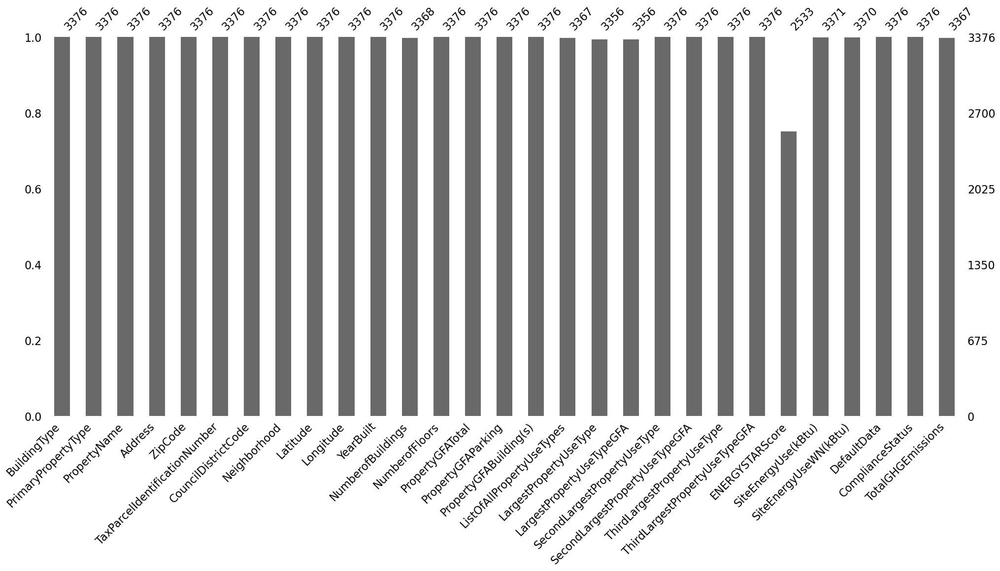

In [39]:
#les variables misc_data
import missingno as msno
msno.bar(df_cleaned);

In [40]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
DefaultData,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
PropertyGFABuilding(s),100.00,0
ComplianceStatus,100.00,0
PropertyGFATotal,100.00,0
NumberofFloors,100.00,0


#### <font color='teal'> Imputation des données manquantes Categorielle</font>

In [41]:
from sklearn.preprocessing import StandardScaler

In [42]:
%%time
from sklearn.model_selection import KFold


def do_cross_validation_Cat(df,imputer, print_model=False,Nbsplit = 6):
    
    # Deux imputer fourni par sklearn seront testés.
    # Un jeu d'entrainement A qui représente 20% sera tiré de façon aléatoire à partir de notre dataset.
    # Des valeurs manquantes seront générées aléatoirement dans A.
    # La metrique de comparaison des imputer sera le RMSE et le MAE.

    ## Create dataset without Nas
    na_df = df.select_dtypes(exclude=np.number).dropna().copy().values

    # Create Index
    idNan = np.arange(na_df.size)

    # Generate idx Nas
    idNan = np.random.choice(idNan, size=round((na_df.shape[0] * na_df.shape[1])*0.2), replace=False)

    ## Create train Nas dataset
    Xna = na_df.ravel()
    Xna = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna) ]).reshape(na_df.shape)
    
    # cross validate
    kf = KFold(n_splits=Nbsplit)
    
    # list des score
    score_rmse = []
    score_mae = []
    
    for train, test in kf.split(na_df):
        # Create Index
        idNan = train.size

        # Generate idx Nas
        idNan = np.random.choice(idNan, size=int(round(len(train)*0.4,0)), replace=False)

        ## Create train Nas dataset
        Xna_train = na_df[train].ravel()
        Xna_train = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_train) ]).reshape(na_df[train].shape)
        
        ## Create test Nas dataset
        Xna_test = na_df[test].ravel()
        Xna_test = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_test) ]).reshape(na_df[test].shape)
        
        
        ## Fit imputer
        imputer.fit( Xna_train )
        
        ## transform X
        X_Imputer = imputer.transform( Xna_test )

        score_accuracy.append( accuracy_score( na_df[test].ravel() , X_Imputer.ravel(), normalize=True)  )
        
        
    mean_accuracy = np.mean(score_accuracy)
    
    std_accuracy = np.std(score_accuracy)
    
    scoresAccuracy = ' + '.join(f'{s:.2f}' for s in score_accuracy)
    msg = f'Cross-validated rmse: ({scoresAccuracy}) / 3 = {mean_accuracy:.2f}'
    
    if print_model:
        msg = f'{imputer}:\n\t{msg}\n'
    
    print(msg)

CPU times: total: 0 ns
Wall time: 0 ns


##### count le nombre de modalité  des colonne LargestPropertyUseType et ListOfAllPropertyUseTypes

In [43]:
df_cleaned.LargestPropertyUseType.nunique()

56

In [44]:
df_cleaned.ListOfAllPropertyUseTypes.nunique()

466

In [45]:
# Display des batiments dont l'info LargestPropertyUseType est manquant 
df_cleaned.loc[df_cleaned.LargestPropertyUseType.isna(),['BuildingType','PrimaryPropertyType','CouncilDistrictCode','PropertyGFABuilding(s)','ListOfAllPropertyUseTypes','LargestPropertyUseType','SecondLargestPropertyUseType']]

,BuildingType,PrimaryPropertyType,CouncilDistrictCode,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType
OSEBuildingID,,,,,,,
496,NonResidential,Self-Storage Facility,6,111445,"Fitness Center/Health Club/Gym, Office, Other ...",NaN,void
773,NonResidential,Small- and Mid-Sized Office,7,63150,NaN,NaN,void
19798,Multifamily LR (1-4),Low-Rise Multifamily,4,33166,NaN,NaN,void
20762,Multifamily HR (10+),High-Rise Multifamily,7,219874,Multifamily Housing,NaN,void
21103,NonResidential,Hotel,7,61721,Hotel,NaN,void
21950,Multifamily MR (5-9),Mid-Rise Multifamily,7,45715,Multifamily Housing,NaN,void
23319,Multifamily HR (10+),High-Rise Multifamily,3,76855,Multifamily Housing,NaN,void
23355,Multifamily LR (1-4),Low-Rise Multifamily,1,29357,NaN,NaN,void
23437,Multifamily LR (1-4),Low-Rise Multifamily,7,23636,NaN,NaN,void


In [46]:
df_cleaned.shape

(3376, 29)

In [47]:
df_cleaned = df_cleaned.loc[df_cleaned.LargestPropertyUseType.notna()]
df_cleaned.shape

(3356, 29)

#### Traitement de la colonne ListOfAllPropertyUseTypes

#### <font color='teal'> Imputation des données numériques manquantes</font>

In [48]:
%%time
from sklearn.model_selection import KFold

def do_cross_validation_Num(df,imputer, print_model=False,Nbsplit = 6):
    
    
    # Deux imputer fourni par sklearn seront testés.
    # Un jeu d'entrainement A qui représente 20% sera tiré de façon aléatoire à partir de notre dataset.
    # Des valeurs manquantes seront générées aléatoirement dans A.
    # La metrique de comparaison des imputer sera le RMSE et le MAE.

    ## Create dataset without Nas
    na_df = df.select_dtypes(include=np.number).dropna().copy()

    # Scaling Data
    Scaler = StandardScaler().fit(na_df)
    na_df = Scaler.transform(na_df)

    # Create Index
    idNan = np.arange(na_df.size)

    # Generate idx Nas
    idNan = np.random.choice(idNan, size=round((na_df.shape[0] * na_df.shape[1])*0.2), replace=False)

    ## Create train Nas dataset
    Xna = na_df.ravel()
    Xna = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna) ]).reshape(na_df.shape)
    
    # shape 
    n = na_df.shape[0]
    p = na_df.shape[1]
    
    # cross validate
    kf = KFold(n_splits=Nbsplit)
    
    # list des score
    score_rmse = []
    score_mae = []
    
    for train, test in kf.split(na_df):
        # Create Index
        idNan = train.size

        # Generate idx Nas
        idNan = np.random.choice(idNan, size=int(round(len(train)*0.4,0)), replace=False)

        ## Create train Nas dataset
        Xna_train = na_df[train].ravel()
        Xna_train = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_train) ]).reshape(na_df[train].shape)
        
        ## Create test Nas dataset
        Xna_test = na_df[test].ravel()
        Xna_test = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_test) ]).reshape(na_df[test].shape)
        
        
        ## Fit imputer
        imputer.fit( Xna_train )
        
        ## transform X
        X_Imputer = imputer.transform( Xna_test )

        score_rmse.append( mean_squared_error( na_df[test].ravel() , X_Imputer.ravel() ) )
        score_mae.append( mean_absolute_error( na_df[test].ravel() , X_Imputer.ravel() ) )
        
    mean_rmse = np.mean(score_rmse)
    mean_mae  = np.mean(score_mae)
    
    std_rmse = np.std(score_rmse)
    std_mae  = np.std(score_mae)
    
    scoresRMSE = ' + '.join(f'{s:.2f}' for s in score_rmse)
    scoresMAE = ' + '.join(f'{s:.2f}' for s in score_mae)
    msg = f'Cross-validated rmse: ({scoresRMSE}) / 3 = {mean_rmse:.2f}'
    
    if print_model:
        msg = f'{imputer}:\n\t{msg}\n'
    
    print(msg)

CPU times: total: 0 ns
Wall time: 0 ns


In [49]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = SimpleImputer( strategy='mean'), 
                        print_model=False,
                        Nbsplit = 6)

Cross-validated rmse: (0.62 + 0.24 + 0.09 + 0.05 + 0.11 + 0.06) / 3 = 0.19


In [50]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=3, weights="distance"),
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.53 + 0.16 + 0.18 + 0.08 + 0.09 + 0.08) / 3 = 0.19


In [51]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=5, weights="distance"), 
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.57 + 0.10 + 0.13 + 0.05 + 0.09 + 0.05) / 3 = 0.16


In [52]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=10, weights="distance"), 
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.22 + 0.10 + 0.06 + 0.06 + 0.06 + 0.09) / 3 = 0.10


In [53]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = IterativeImputer(max_iter=500, random_state=0),
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.38 + 0.08 + 0.15 + 0.05 + 0.09 + 0.05) / 3 = 0.13


###### <font color='teal'>Selection de l'algorithme d'imputation</font>

In [54]:
df_cleaned.select_dtypes(exclude = np.number).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3356 entries, 1 to 50226
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   BuildingType                   3356 non-null   object
 1   PrimaryPropertyType            3356 non-null   object
 2   PropertyName                   3356 non-null   object
 3   Address                        3356 non-null   object
 4   ZipCode                        3356 non-null   object
 5   TaxParcelIdentificationNumber  3356 non-null   object
 6   Neighborhood                   3356 non-null   object
 7   ListOfAllPropertyUseTypes      3356 non-null   object
 8   LargestPropertyUseType         3356 non-null   object
 9   SecondLargestPropertyUseType   3356 non-null   object
 10  ThirdLargestPropertyUseType    3356 non-null   object
 11  DefaultData                    3356 non-null   bool  
 12  ComplianceStatus               3356 non-null   object
dtypes:

In [55]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
DefaultData,100.00,0
SiteEnergyUse(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
LargestPropertyUseTypeGFA,100.00,0
LargestPropertyUseType,100.00,0
ListOfAllPropertyUseTypes,100.00,0


### <a name="C34"><font color='teal'>3.4 Data inspections</font></a> 

In [56]:
def plot_kde(feature,log_ = True):
    X = df_cleaned.copy()
    if log_:
        X['TotalGHGEmissions'] = np.log1p(X['TotalGHGEmissions'])
        X['SiteEnergyUseWN(kBtu)'] = np.log1p(X['SiteEnergyUseWN(kBtu)'])
    
    fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
    
    sns.kdeplot(data=X,x ='TotalGHGEmissions',hue= feature,ax=axes[0])
    axes[0].set_title(f'TotalGHGEmissions')
    sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))
    
    sns.kdeplot(data=X,x ='SiteEnergyUseWN(kBtu)',hue= feature,ax=axes[1],legend = False)
    axes[1].set_title(f'SiteEnergyUseWN(kBtu)')
    
    plt.xlabel('')

In [57]:
# Inspections des données numériques
df_cleaned.describe()

,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions
count,3356.000000,3356.000000,3356.000000,3356.000000,3356.000000,3356.000000,3.356000e+03,3356.000000,3.356000e+03,3.356000e+03,3356.000000,3356.000000,2526.000000,3.356000e+03,3.355000e+03,3356.000000
mean,4.439213,47.623966,-122.334766,1968.561979,1.106973,4.707986,9.509787e+04,8044.209476,8.705366e+04,7.917764e+04,14230.513497,2084.699165,67.969913,5.416928e+06,5.288799e+06,119.900584
std,2.120976,0.047740,0.027174,33.101767,2.112104,5.503659,2.194351e+05,32417.607343,2.085099e+05,2.017034e+05,41012.952360,13141.799028,26.853410,2.165692e+07,1.597177e+07,539.664612
min,1.000000,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,0.000000e+00,0.000000e+00,-0.800000
25%,3.000000,47.599857,-122.350482,1948.000000,1.000000,2.000000,2.848650e+04,0.000000,2.775600e+04,2.509475e+04,0.000000,0.000000,53.000000,9.280040e+05,9.745083e+05,9.507500
50%,4.000000,47.618635,-122.332480,1974.000000,1.000000,4.000000,4.429100e+04,0.000000,4.323650e+04,3.989400e+04,0.000000,0.000000,75.000000,1.807103e+06,1.908058e+06,34.010000
75%,7.000000,47.657027,-122.319457,1997.000000,1.000000,5.000000,9.115075e+04,0.000000,8.441625e+04,7.620025e+04,10673.000000,0.000000,90.000000,4.226081e+06,4.387392e+06,94.012500
max,7.000000,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,686750.000000,459748.000000,100.000000,8.739237e+08,4.716139e+08,16870.980000


In [58]:
# Inspections des données non numériques
df_cleaned.select_dtypes(exclude=np.number).describe()

,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,DefaultData,ComplianceStatus
count,3356,3356,3356,3356,3356,3356,3356,3356,3356,3356,3356,3356,3356
unique,8,24,3342,3334,55,3248,19,465,56,51,45,2,4
top,NonResidential,Low-Rise Multifamily,Northgate Plaza,309 South Cloverdale Street,98109,1625049001,DOWNTOWN,Multifamily Housing,Multifamily Housing,void,void,False,Compliant
freq,1454,976,3,4,294,8,569,860,1667,1677,2760,3243,3196


In [59]:
df_cleaned.drop(columns=["CouncilDistrictCode",'PropertyName','TaxParcelIdentificationNumber'],inplace=True)

###### Etude de la colonne ListOfAllPropertyUseTypes

In [60]:
df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.lower()

In [61]:
df_cleaned['ListOfAllPropertyUseTypes'] = [x.replace('repair services (vehicle, shoe, locksmith, etc)','repair services (vehicle shoe locksmith etc)')\
 .replace('personal services (health/beauty, dry cleaning, etc)','personal services (health/beauty dry cleaning etc)') for x in df_cleaned.ListOfAllPropertyUseTypes]

In [62]:
df_cleaned.loc[[len(x.split(', '))<3 if x is not np.nan else False for x in df_cleaned.ListOfAllPropertyUseTypes.str.lower()],['PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','ListOfAllPropertyUseTypes']]\
.drop_duplicates().sample(10)

,PrimaryPropertyType,LargestPropertyUseType,SecondLargestPropertyUseType,ListOfAllPropertyUseTypes
OSEBuildingID,,,,
517,Supermarket / Grocery Store,Wholesale Club/Supercenter,void,wholesale club/supercenter
48287,Large Office,Office,Other - Services,"office, other - services"
753,Other,Data Center,Office,"data center, office"
19787,Worship Facility,Worship Facility,K-12 School,"k-12 school, worship facility"
633,Large Office,Office,Data Center,"data center, office"
49716,Residence Hall,Residence Hall/Dormitory,Supermarket/Grocery Store,"residence hall/dormitory, supermarket/grocery ..."
24716,Refrigerated Warehouse,Refrigerated Warehouse,Other,"other, refrigerated warehouse"
446,Distribution Center,Distribution Center,Office,"distribution center, office"
52,Small- and Mid-Sized Office,Office,Non-Refrigerated Warehouse,"non-refrigerated warehouse, office"


In [63]:
# df_cleaned.drop(columns=['ListOfAllPropertyUseTypes'],inplace=True)
df_cleaned.shape

(3356, 26)

###### Etude de la colonne ComplianceStatus

In [64]:
df_cleaned.ComplianceStatus.str.lower().value_counts()

compliant                       3196
error - correct default data     113
non-compliant                     32
missing data                      15
Name: ComplianceStatus, dtype: int64

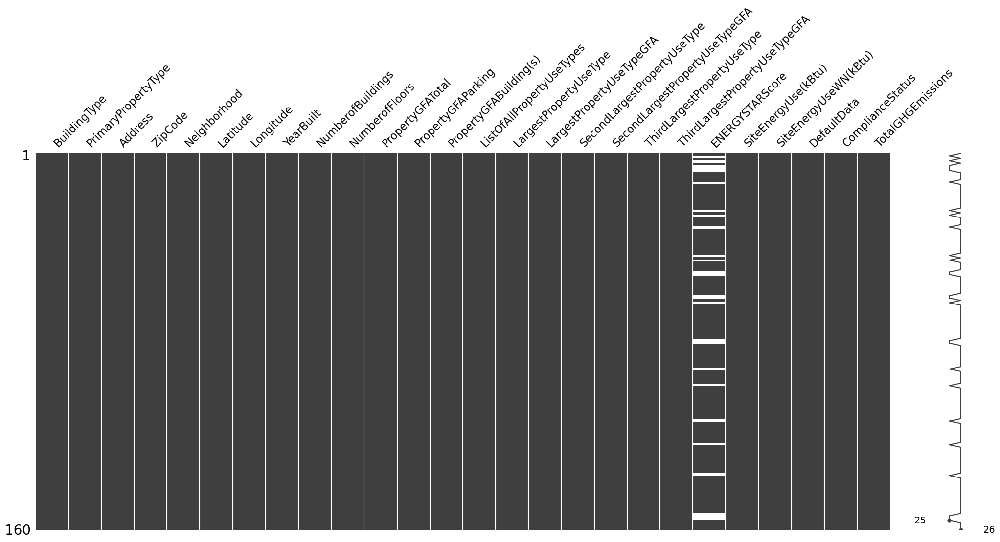

In [65]:
msno.matrix(df_cleaned[df_cleaned.ComplianceStatus!='Compliant']);

###### Suppression de lignes non Compliants

In [66]:
df_cleaned = df_cleaned.loc[df_cleaned.ComplianceStatus=='Compliant']
df_cleaned.shape

(3196, 26)

###### Creation de la colonne age à partir de YearBuilt

In [67]:
df_cleaned['Age'] = 2016-df_cleaned.YearBuilt
df_cleaned.drop(columns=['YearBuilt','ComplianceStatus'],inplace=True)
df_cleaned.shape

(3196, 25)

In [68]:
df_cleaned.select_dtypes(exclude=np.number).describe()

,BuildingType,PrimaryPropertyType,Address,ZipCode,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,DefaultData
count,3196,3196,3196,3196,3196,3196,3196,3196,3196,3196
unique,8,23,3174,55,19,459,55,51,45,1
top,NonResidential,Low-Rise Multifamily,309 South Cloverdale Street,98109,DOWNTOWN,multifamily housing,Multifamily Housing,void,void,False
freq,1428,948,4,291,553,835,1626,1549,2613,3196


In [69]:
#Suppression de DefaultData qui est une variable constante
df_cleaned.drop(columns=['DefaultData'],inplace=True)
df_cleaned.shape

(3196, 24)

###### Etude des variables catégorielles

#### BuildingType

In [70]:
df_cleaned.BuildingType.str.lower().value_counts()

nonresidential          1428
multifamily lr (1-4)     977
multifamily mr (5-9)     569
multifamily hr (10+)     106
nonresidential cos        81
campus                    24
sps-district k-12         10
nonresidential wa          1
Name: BuildingType, dtype: int64

#### Regroupement des modalités rares
- Nonresidential WA

In [71]:
df_cleaned.select_dtypes(exclude=np.number).loc[df_cleaned.BuildingType=="Nonresidential WA"]

,BuildingType,PrimaryPropertyType,Address,ZipCode,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
OSEBuildingID,,,,,,,,,
50101,Nonresidential WA,University,4331 Memorial Way NE,98195,NORTHEAST,college/university,College/University,void,void


In [72]:
# PrimaryPropertyType
print("La modalité la plus représenté parmi les batiment dt le PrimaryPropertyType = 'University' est :",
df_cleaned.loc[df_cleaned.PrimaryPropertyType=="University",'BuildingType'].value_counts().index[0])

# ListOfAllPropertyUseTypes
#print("La modalité la plus représenté parmi les batiment dt le ListOfAllPropertyUseTypes = 'College/University' est :",
#df_cleaned.loc[df_cleaned.ListOfAllPropertyUseTypes=="College/University",'BuildingType'].value_counts().index[0])

# LargestPropertyUseType
print("La modalité la plus représenté parmi les batiment dt le LargestPropertyUseType = 'College/University' est :",
      df_cleaned.loc[df_cleaned.LargestPropertyUseType=="College/University",'BuildingType'].value_counts().index[0]
     )

La modalité la plus représenté parmi les batiment dt le PrimaryPropertyType = 'University' est : NonResidential
La modalité la plus représenté parmi les batiment dt le LargestPropertyUseType = 'College/University' est : NonResidential


In [73]:
# Les deux valeurs sont proche donc sans crainte on peut remplacer "Nonresidential WA" par 'NonResidential'
df_cleaned.loc[df_cleaned.BuildingType=="Nonresidential WA",'BuildingType'] = 'NonResidential'

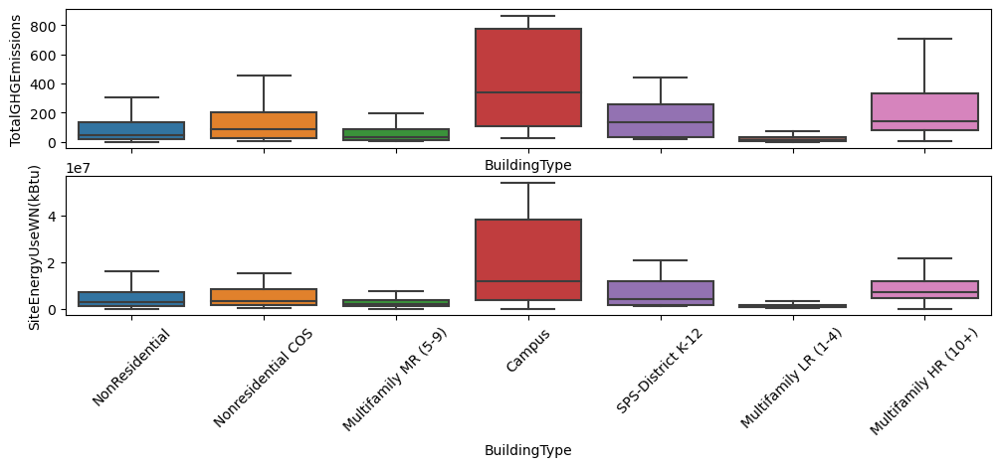

In [74]:
# BuildingType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='BuildingType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='BuildingType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

In [75]:
def plot_kde(feature,log_ = True):
    X = df_cleaned.copy()
    if log_:
        X['TotalGHGEmissions'] = np.log1p(X['TotalGHGEmissions'])
        X['SiteEnergyUseWN(kBtu)'] = np.log1p(X['SiteEnergyUseWN(kBtu)'])
    
    fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
    
    sns.kdeplot(data=X,x ='TotalGHGEmissions',hue= feature,ax=axes[0])
    axes[0].set_title(f'TotalGHGEmissions')
    sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))
    
    sns.kdeplot(data=X,x ='SiteEnergyUseWN(kBtu)',hue= feature,ax=axes[1],legend = False)
    axes[1].set_title(f'SiteEnergyUseWN(kBtu)')
    
    plt.xlabel('')

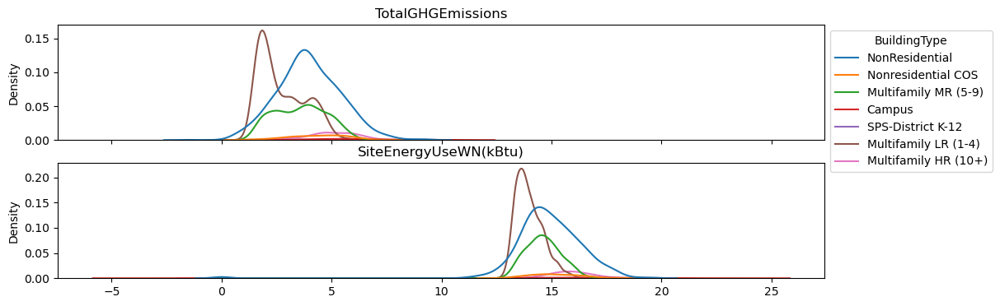

In [76]:
plot_kde('BuildingType',log_ = True)

##### Lattitude longitude

In [77]:
import plotly.express as px

color_scale = [(0, 'orange'), (1,'red')]
df_out = df_cleaned[df_cleaned['SiteEnergyUseWN(kBtu)'].notna()].dropna(axis='columns')

from sklearn.preprocessing import StandardScaler
elect_scalMM = (df_out['SiteEnergyUseWN(kBtu)'] - df_out['SiteEnergyUseWN(kBtu)'].mean(axis=0)) / (df_out['SiteEnergyUseWN(kBtu)'].std(axis=0))
fig = px.scatter_mapbox(df_out, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Address", 
                        hover_data=["Address", "SiteEnergyUseWN(kBtu)"],
                        color="SiteEnergyUseWN(kBtu)",
                        color_continuous_scale=color_scale,
                        size=elect_scalMM+1,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [78]:
import plotly.express as px

color_scale = [(0, 'orange'), (1,'red')]
df_out = df_cleaned[df_cleaned['TotalGHGEmissions'].notna()].dropna(axis='columns')

from sklearn.preprocessing import StandardScaler
elect_scalMM = (df_out['TotalGHGEmissions'] - df_out['TotalGHGEmissions'].mean(axis=0)) / (df_out['TotalGHGEmissions'].std(axis=0))
fig = px.scatter_mapbox(df_out, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Address", 
                        hover_data=["Address", "TotalGHGEmissions"],
                        color="TotalGHGEmissions",
                        color_continuous_scale=color_scale,
                        size=elect_scalMM+1,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

##### Address

In [79]:
df_cleaned.drop(columns=['Address'],inplace=True)
df_cleaned.shape

(3196, 23)

##### Neighborhood

In [80]:
df_cleaned.Neighborhood.str.lower().value_counts()

downtown                  553
east                      438
magnolia / queen anne     411
greater duwamish          357
northeast                 264
lake union                243
northwest                 207
north                     175
southwest                 147
ballard                   125
central                   121
southeast                  78
delridge                   76
delridge neighborhoods      1
Name: Neighborhood, dtype: int64

C:\Users\eleor\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

C:\Users\eleor\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



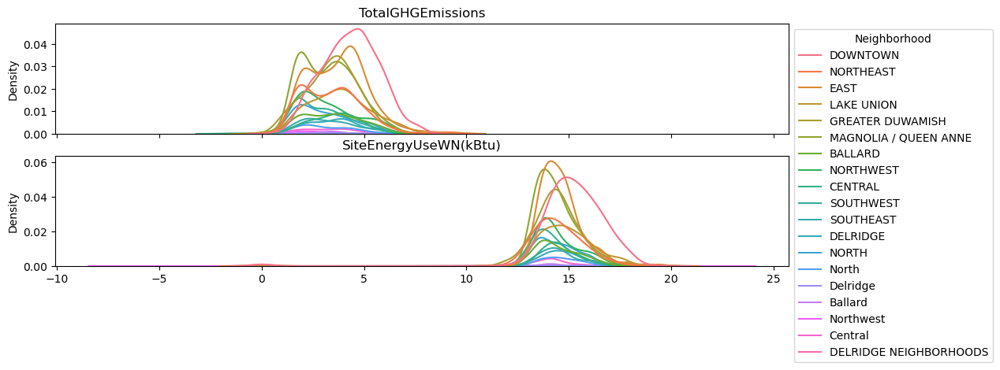

In [81]:
plot_kde('Neighborhood',log_ = True)

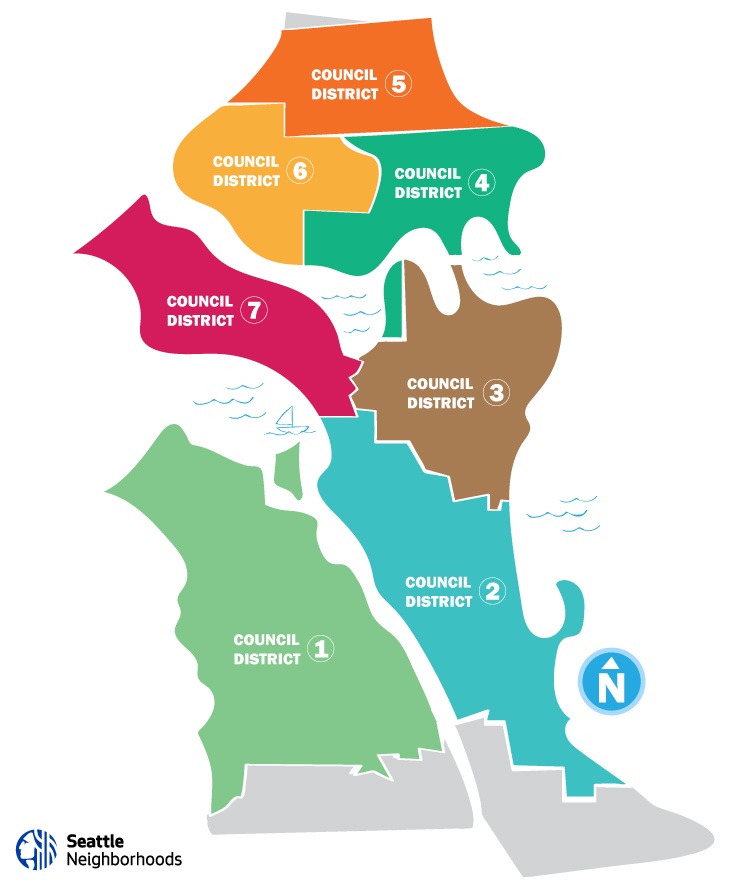

In [82]:
# On obtient 14 modalité en lower les valeurs
df_cleaned['Neighborhood'] = df_cleaned.Neighborhood.str.lower()
df_cleaned.loc[df_cleaned.Neighborhood=='delridge neighborhoods','Neighborhood'] = 'delridge'

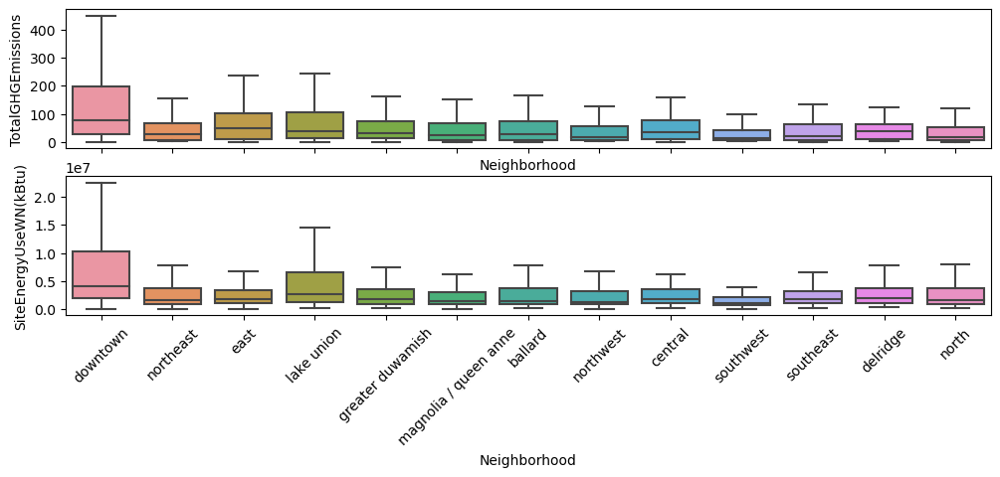

In [83]:
# Neighborhood
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='Neighborhood',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='Neighborhood',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

In [84]:
df_cleaned.PrimaryPropertyType.str.lower().value_counts()

low-rise multifamily           948
mid-rise multifamily           552
small- and mid-sized office    286
other                          250
warehouse                      185
large office                   169
mixed use property             132
high-rise multifamily          101
retail store                    85
hotel                           75
worship facility                69
distribution center             53
k-12 school                     50
senior care community           44
supermarket / grocery store     40
medical office                  39
self-storage facility           27
university                      25
residence hall                  23
refrigerated warehouse          12
restaurant                      11
hospital                        10
laboratory                      10
Name: PrimaryPropertyType, dtype: int64

##### PrimaryPropertyType

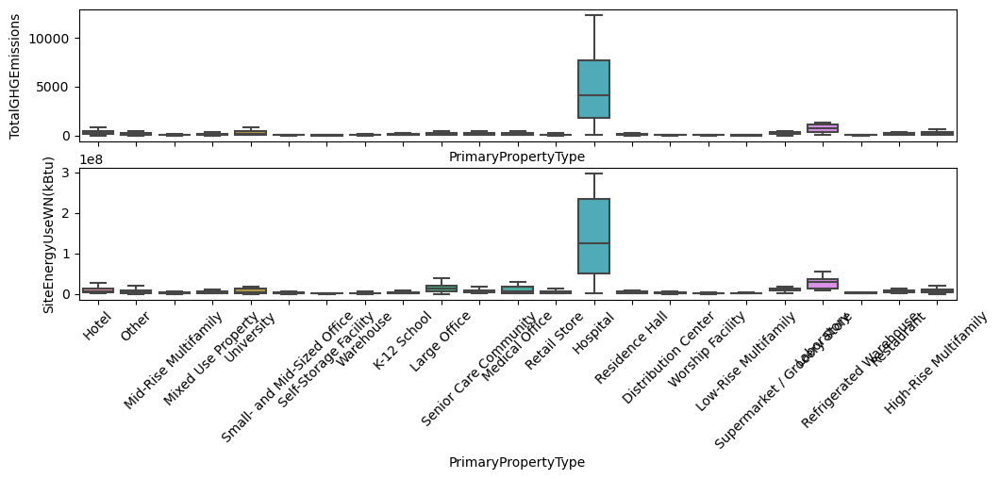

In [85]:
### PrimaryPropertyType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='PrimaryPropertyType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='PrimaryPropertyType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

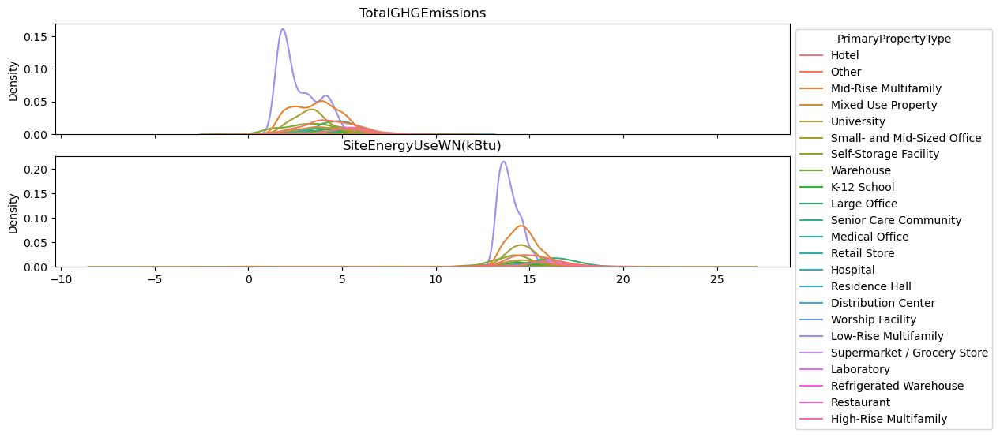

In [86]:
plot_kde('PrimaryPropertyType',log_ = True)

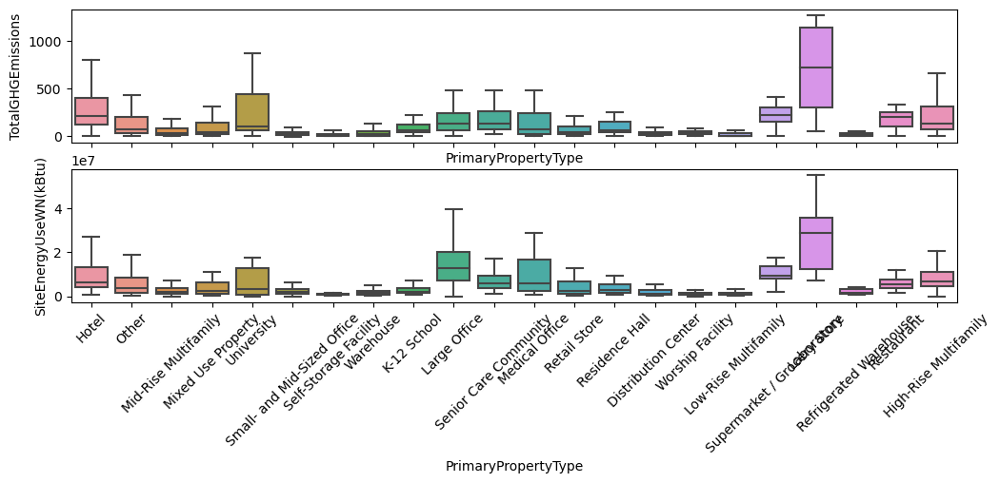

In [87]:
### PrimaryPropertyType sans la modalité "Hospital"
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned.loc[df_cleaned.PrimaryPropertyType != 'Hospital'],x='PrimaryPropertyType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned.loc[df_cleaned.PrimaryPropertyType != 'Hospital'],x='PrimaryPropertyType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

##### LargestPropertyUseType

In [88]:
df_cleaned['LargestPropertyUseType'] = df_cleaned.LargestPropertyUseType.str.lower()

In [89]:
df_cleaned.LargestPropertyUseType.str.lower().value_counts()

multifamily housing                                     1626
office                                                   486
non-refrigerated warehouse                               197
other                                                     98
retail store                                              93
hotel                                                     76
worship facility                                          69
distribution center                                       54
k-12 school                                               50
senior care community                                     45
supermarket/grocery store                                 41
medical office                                            41
parking                                                   32
other - recreation                                        31
self-storage facility                                     28
college/university                                        25
residence hall/dormitory

In [90]:
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'personal services (health/beauty, dry cleaning, etc)','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'movie theater','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'food service','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'police station','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'wholesale club/supercenter','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'residential care facility','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'courthouse','LargestPropertyUseType'] = 'data center'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'fire station','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'pre-school/daycare','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - utility','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'adult education','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - restaurant/bar','LargestPropertyUseType'] = 'restaurant'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - public services','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'lifestyle center','LargestPropertyUseType'] = 'other - mall'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'performing arts','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'library','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'financial office','LargestPropertyUseType'] = 'grouping'

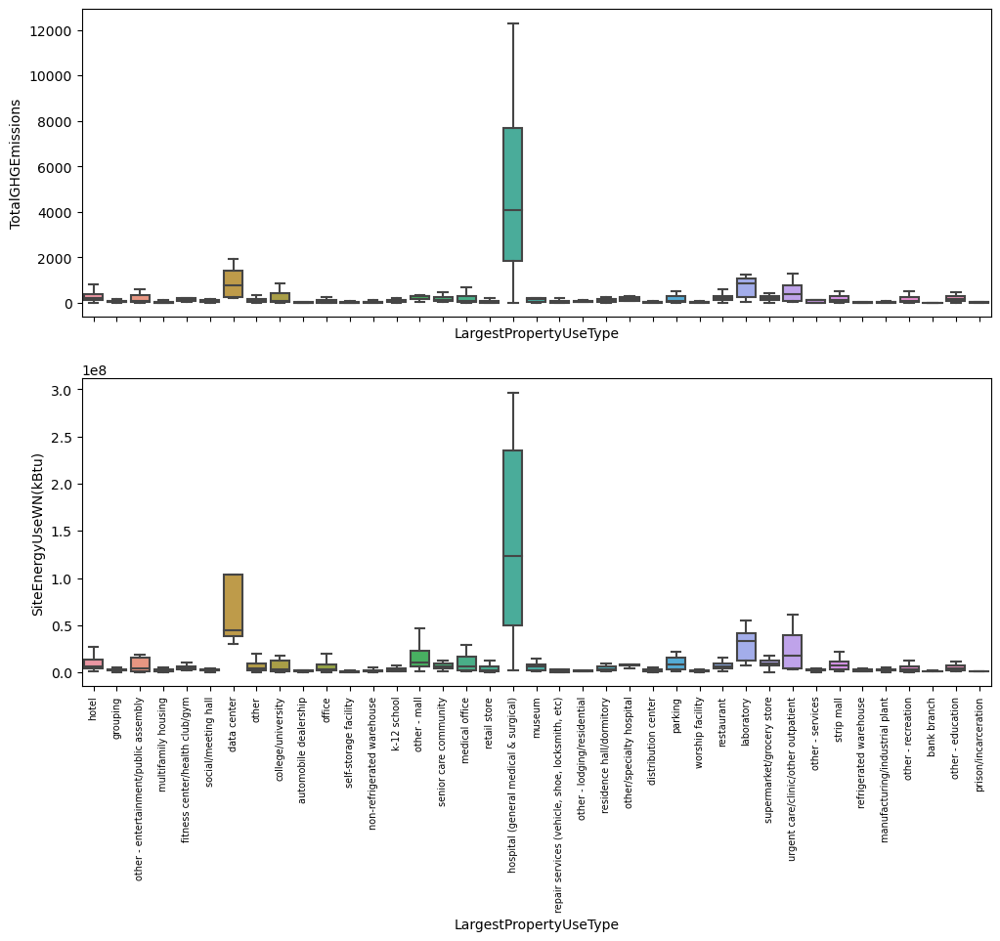

In [91]:
### LargestPropertyUseType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='LargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='LargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

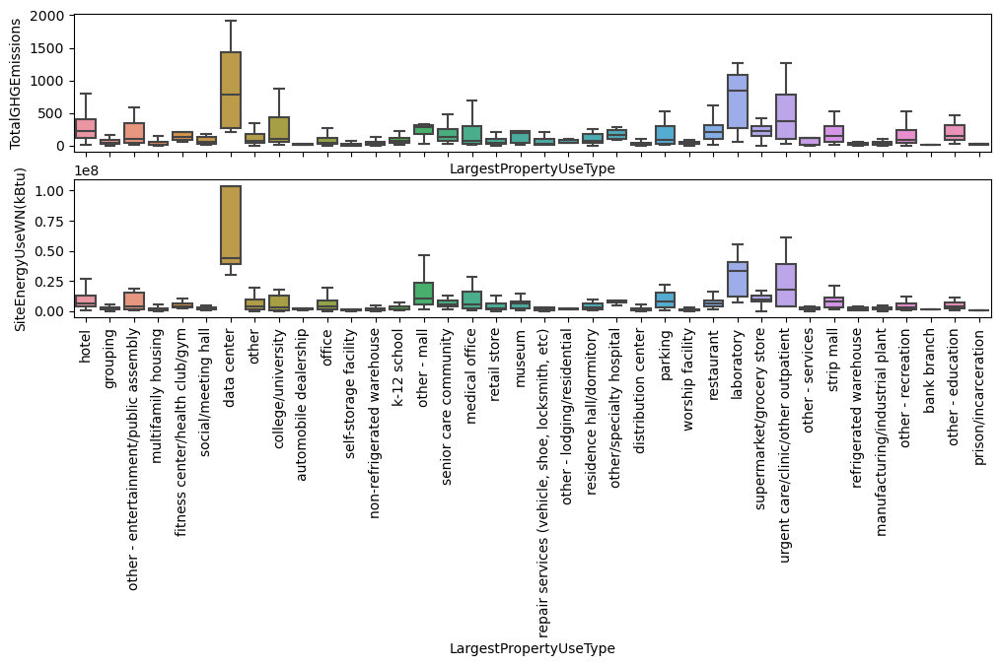

In [92]:
### LargestPropertyUseType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned.loc[df_cleaned.LargestPropertyUseType.str.lower() != 'hospital (general medical & surgical)'],x='LargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned.loc[df_cleaned.LargestPropertyUseType.str.lower() != 'hospital (general medical & surgical)'],x='LargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### SecondLargestPropertyUseType   

In [93]:
df_cleaned['SecondLargestPropertyUseType'] = df_cleaned.SecondLargestPropertyUseType.str.lower()

In [94]:
df_cleaned.SecondLargestPropertyUseType.str.lower().value_counts()

void                                                    1549
parking                                                  962
office                                                   213
retail store                                             151
other                                                     56
restaurant                                                40
non-refrigerated warehouse                                31
multifamily housing                                       17
fitness center/health club/gym                            17
data center                                               12
other - services                                          12
supermarket/grocery store                                 12
medical office                                            11
swimming pool                                             10
laboratory                                                 8
other - entertainment/public assembly                      7
bank branch             

In [95]:
mask = df_cleaned.SecondLargestPropertyUseType.value_counts().index[df_cleaned.SecondLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseType.apply(lambda x: x in mask),'SecondLargestPropertyUseType'] = 'grouping'

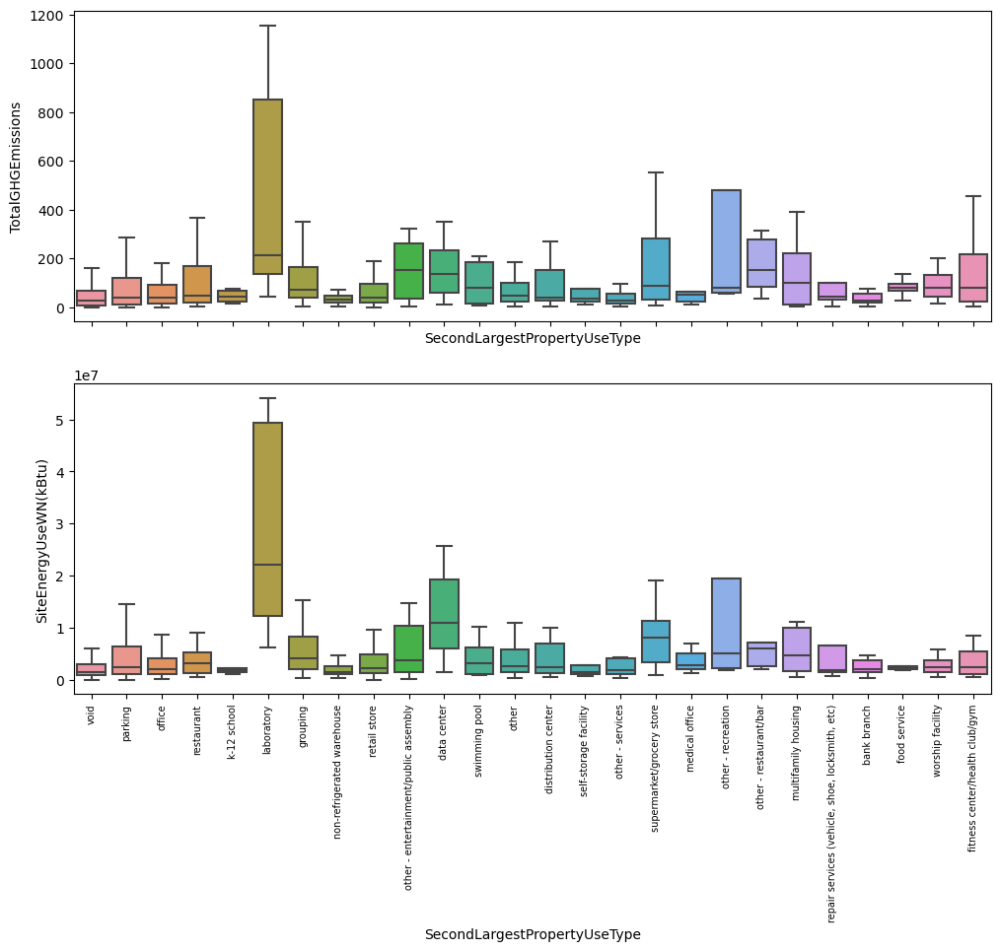

In [96]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='SecondLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='SecondLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### ThirdLargestPropertyUseType

In [97]:
df_cleaned['ThirdLargestPropertyUseType'] = df_cleaned.ThirdLargestPropertyUseType.str.lower()

In [98]:
df_cleaned.ThirdLargestPropertyUseType.value_counts()

void                                                    2613
retail store                                             107
office                                                   105
parking                                                   69
restaurant                                                55
other                                                     49
swimming pool                                             26
non-refrigerated warehouse                                17
medical office                                            17
data center                                               13
multifamily housing                                       12
food service                                              11
social/meeting hall                                       11
other - restaurant/bar                                     9
pre-school/daycare                                         8
bank branch                                                6
fitness center/health cl

In [99]:
mask = df_cleaned.ThirdLargestPropertyUseType.value_counts().index[df_cleaned.ThirdLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType.apply(lambda x: x in mask),'ThirdLargestPropertyUseType'] = 'grouping'

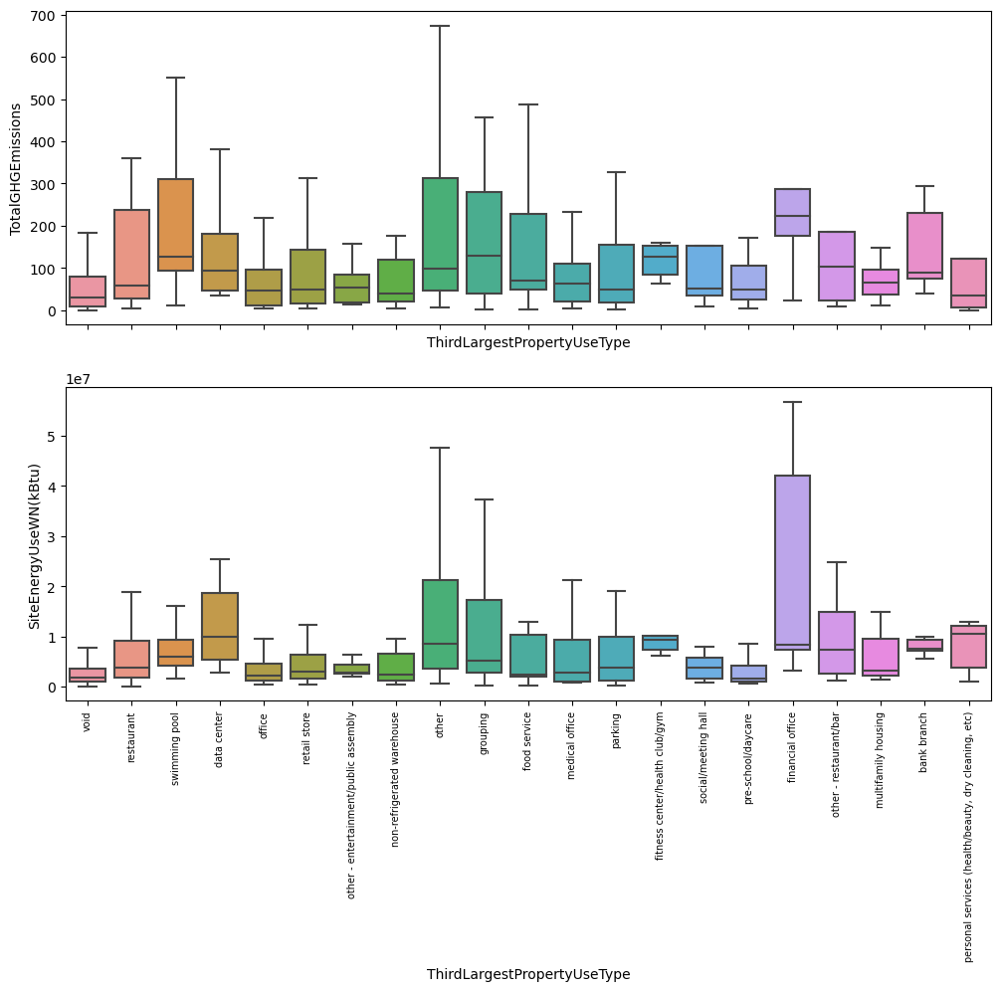

In [100]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='ThirdLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='ThirdLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### Zipcode

In [101]:
df_cleaned.ZipCode.value_counts()

98109    291
98104    241
98122    235
98101    223
98134    184
98105    182
98121    180
98102    164
98119    163
98103    150
98125    143
98108    122
98133    118
98115    117
98107     99
98144     91
98116     80
98118     69
98199     68
98112     62
98126     60
98106     44
98117     27
98136     26
98195     10
98146      5
98155      4
98111      3
98114      2
98178      2
98013      2
98177      2
98124      2
98164      2
98154      2
98168      2
98006      1
98165      1
98272      1
98020      1
98204      1
98040      1
98113      1
98198      1
98011      1
98070      1
98127      1
98033      1
98191      1
98028      1
98185      1
98012      1
98181      1
98053      1
98145      1
Name: ZipCode, dtype: int64

In [102]:
mask = df_cleaned.ZipCode.value_counts().index[df_cleaned.ZipCode.value_counts()<10].to_list()
df_cleaned.loc[df_cleaned.ZipCode.apply(lambda x: x in mask),'ZipCode'] = 'grouping'

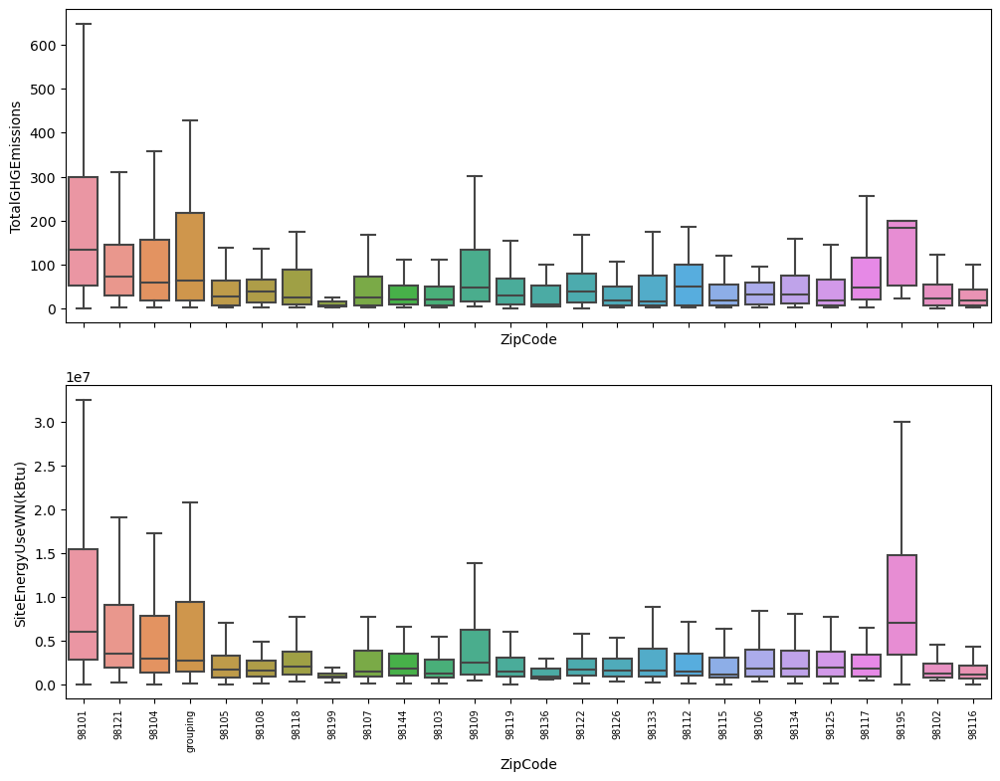

In [103]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='ZipCode',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='ZipCode',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

#### <font color='teal'> - 3.4.1 Data target numerique</font>

###### Etude distribution 

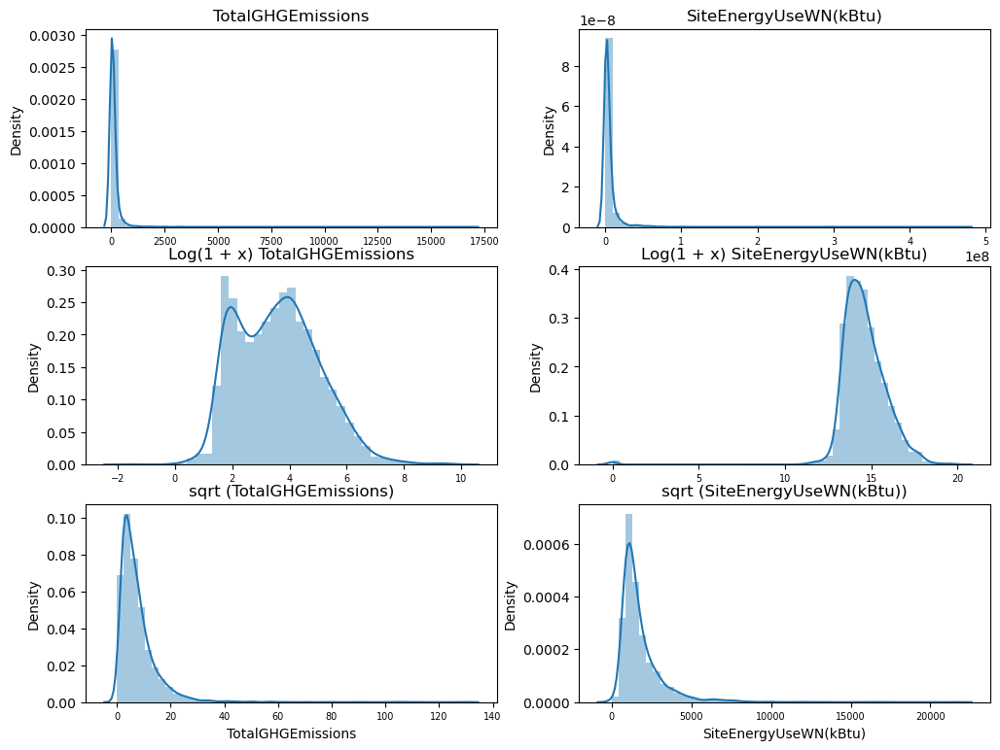

In [104]:
warnings.filterwarnings(action='ignore')
fig = plt.figure(figsize=(12, 9))

for idx,feat in enumerate(['TotalGHGEmissions','SiteEnergyUseWN(kBtu)']):
    for i,tr in enumerate(['raw','log','sqrt']):
        if tr == 'raw':
            ax = fig.add_subplot(3,2, (idx+i+1))
            #h = ax.hist(df_cleaned[feat], bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(df_cleaned[feat],ax=ax).set(title=feat)
            #ax.set_title(feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            ax.set(xlabel='')
            
        if tr == 'log':
            ax = fig.add_subplot(3,2, (idx+i+2))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(np.log1p(df_cleaned[feat]),ax=ax,kde=True).set(title='Log(1 + x) '+feat)
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            ax.set(xlabel='')
            
        if tr == 'sqrt':
            ax = fig.add_subplot(3,2, (idx+i+3))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(np.sqrt(df_cleaned[feat]),ax=ax,kde=True).set(title='sqrt ('+feat+')')
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)

<div class="alert alert-success">
La transformation de nos variables cibles grace la fonction log1p </br>
nous permet d'obtenir des distribution ressemblante à des courbes en cloche.</div>

In [105]:
df_cleaned[['TotalGHGEmissions','SiteEnergyUseWN(kBtu)']].describe().style.format('{:.3f}')

,TotalGHGEmissions,SiteEnergyUseWN(kBtu)
count,3196.000,3195.000
mean,122.406,5404201.284
std,552.431,16323752.475
min,-0.800,0.000
25%,9.650,988072.094
50%,34.000,1908057.875
75%,94.500,4435780.500
max,16870.980,471613856.000


valeurs négatives pour une émissions?

In [106]:
df.loc[df.TotalGHGEmissions<0,["Longitude","Latitude",'Address','PropertyName','SiteEnergyUse(kBtu)']]

,Longitude,Latitude,Address,PropertyName,SiteEnergyUse(kBtu)
3206,-122.31257,47.61432,1501 E. Madison St.,Bullitt Center,342726.0938


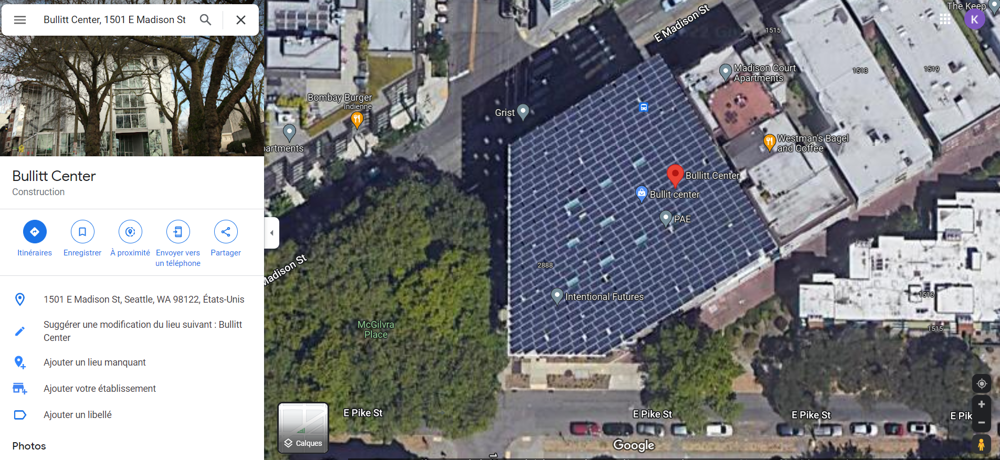

<div class="alert alert-info">
Ce n'est pas une erreur!!! </br>
Ce batiment est couvert de panneau solaire photovoltaique. </br>
Ce batiment peut donc produire plus qu'elle ne consomme d'énergie, et obtenir un TotalGHGEmissions négatif
</div>

##### NumberofBuildings

In [107]:
df_cleaned.NumberofBuildings.value_counts().sort_index()

0.0        91
1.0      3007
2.0        35
3.0        22
4.0        12
5.0         9
6.0         5
7.0         1
8.0         3
9.0         2
10.0        2
11.0        1
14.0        2
16.0        1
23.0        1
27.0        1
111.0       1
Name: NumberofBuildings, dtype: int64

In [108]:
df.loc[df.NumberofBuildings==df.NumberofBuildings.max()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions
3274,49967,2016,Campus,University,University of Washington - Seattle Campus,NE 45th St & Brooklyn Ave,Seattle,WA,98105.0,1625049001,...,NaN,NaN,NaN,873923712.0,0.0,False,NaN,Compliant,NaN,11140.56


In [109]:
df.loc[df.NumberofBuildings==df.NumberofBuildings.min(),['BuildingType','PrimaryPropertyType','PropertyName','Address','City','State','ZipCode']]

,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode
63,NonResidential,Medical Office,Polyclinic North && South,1200 Harvard Ave,Seattle,WA,98122.0
76,NonResidential,Small- and Mid-Sized Office,KCTS9,401 Mercer St,Seattle,WA,98109.0
160,NonResidential,Warehouse,Harbor Island: Warehouse E - DNRP-SWD,3235 16TH AVE SW,Seattle,WA,98134.0
201,NonResidential,Large Office,Cox Media Group Seattle KIRO TV (322),2801 3rd Ave,Seattle,WA,98121.0
241,NonResidential,Small- and Mid-Sized Office,University District Office Buiding,1107 NE 45th St,Seattle,WA,98105.0
...,...,...,...,...,...,...,...
3184,Multifamily MR (5-9),Mid-Rise Multifamily,Oakwood SeattleSouth LakeUnion (Hue),717 Dexter Ave North,Seattle,WA,98109.0
3202,Multifamily MR (5-9),Mid-Rise Multifamily,Ernestine Anderson Place,2010 S Jackson Street,Seattle,WA,98144.0
3205,NonResidential,Laboratory,UW Medicine Phase 3.1,750 Republican Street,Seattle,WA,98109.0
3232,Nonresidential COS,Other,SCT Technical Pavilion,201 Thomas St.,Seattle,WA,98109.0


In [110]:
df_cleaned.loc[df_cleaned.NumberofBuildings==df_cleaned.NumberofBuildings.min(),['NumberofBuildings']] = np.nan

##### NumberofFloors

In [111]:
df_cleaned.NumberofFloors.value_counts().sort_index()

0      16
1     424
2     396
3     647
4     663
5     290
6     300
7     144
8      62
9      18
10     32
11     32
12     21
13     19
14     13
15      7
16      7
17      8
18      7
19      6
20      5
21      5
22      4
23      7
24      6
25      5
26      6
27      5
28      2
29      3
30      1
31      2
32      1
33      6
34      2
36      2
37      2
38      1
39      1
40      1
41      3
42      6
46      1
47      1
49      1
55      1
56      1
63      1
76      1
99      1
Name: NumberofFloors, dtype: int64

In [112]:
df.loc[df.NumberofFloors==df.NumberofFloors.min(),['NumberofFloors','BuildingType','PrimaryPropertyType','PropertyName','Address','City','State','ZipCode']]

,NumberofFloors,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode
166,0,NonResidential,Hotel,Grand Hyatt Seattle,721 Pine St,Seattle,WA,98101.0
487,0,NonResidential,Medical Office,Arnold Pavilion,1221 Madison Street,Seattle,WA,98104.0
488,0,NonResidential,Mixed Use Property,2200 Westlake - SEDO,2200 Westlake Ave.,Seattle,WA,98121.0
564,0,NonResidential,Other,Pacific Place,600 Pine Street,Seattle,WA,98101.0
1754,0,NonResidential,Medical Office,HART First Hill LLC,1124 Columbia Street,Seattle,WA,98104.0
1993,0,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,1333 AIRPORT WAY S,Seattle,WA,98134.0
3130,0,NonResidential,Warehouse,Sandpoint #5,7561 63rd Ave NE,Seattle,WA,98115.0
3131,0,NonResidential,Medical Office,Sandpoint #25,6222 NE 74th St,Seattle,WA,98115.0
3132,0,NonResidential,Small- and Mid-Sized Office,Sandpoint #29,6200 NE 74th ST,Seattle,WA,98115.0
3168,0,Nonresidential COS,Other,Magnuson,7400 Sand Point Way NE,Seattle,WA,98115.0


##### Others

In [113]:
df_cleaned[['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore','Age']].describe()

,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,Age
count,3.196000e+03,3196.000000,3.196000e+03,3.196000e+03,3196.000000,3196.000000,2392.000000,3196.000000
mean,9.598123e+04,8399.683980,8.758154e+04,7.945189e+04,14550.846776,2164.475719,67.305184,47.292553
std,2.232701e+05,33163.128982,2.120166e+05,2.055745e+05,40101.891243,13448.563871,26.945530,33.172558
min,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,1.000000
25%,2.828750e+04,0.000000,2.755250e+04,2.498950e+04,0.000000,0.000000,52.000000,19.000000
50%,4.385500e+04,0.000000,4.287400e+04,3.900000e+04,0.000000,0.000000,74.000000,41.000000
75%,9.162575e+04,0.000000,8.474175e+04,7.676675e+04,11400.000000,0.000000,89.000000,68.000000
max,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,639931.000000,459748.000000,100.000000,116.000000


### <a name="C35"><font color='teal'>3.5 Data Visualisation Multivariée</font></a> 

Box plot
Histogram
Multi-vari chart
Run chart
Pareto chart
Scatter plot (2D/3D)
Stem-and-leaf plot
Parallel coordinates
Odds ratio
Targeted projection pursuit
Heat map
Bar chart

#### <font color='teal'> - 3.5.1 Data target numerique</font>

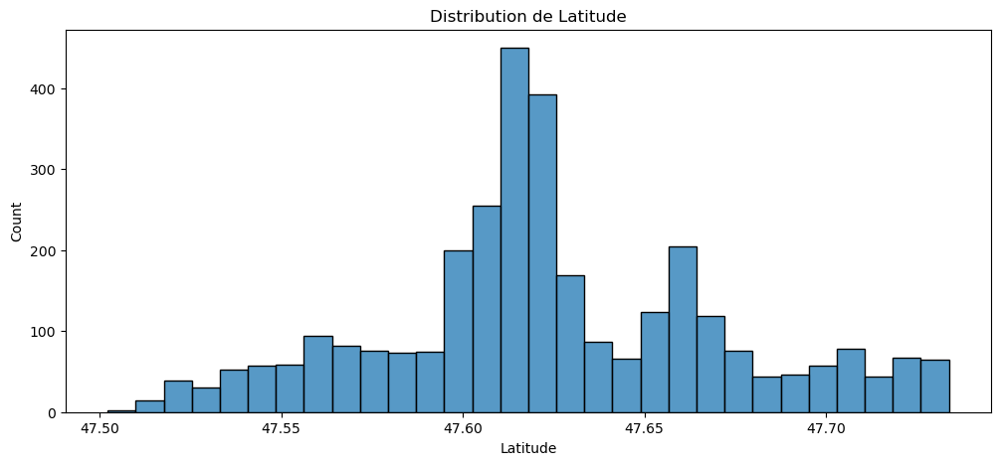

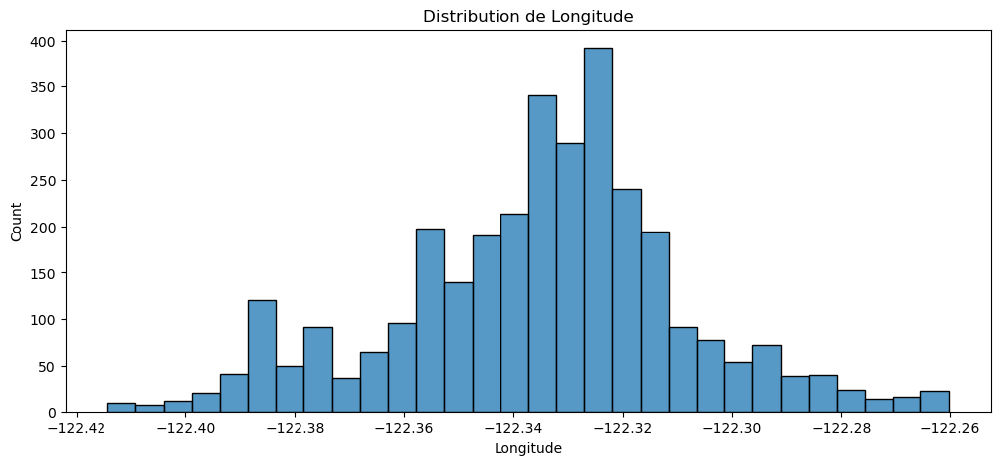

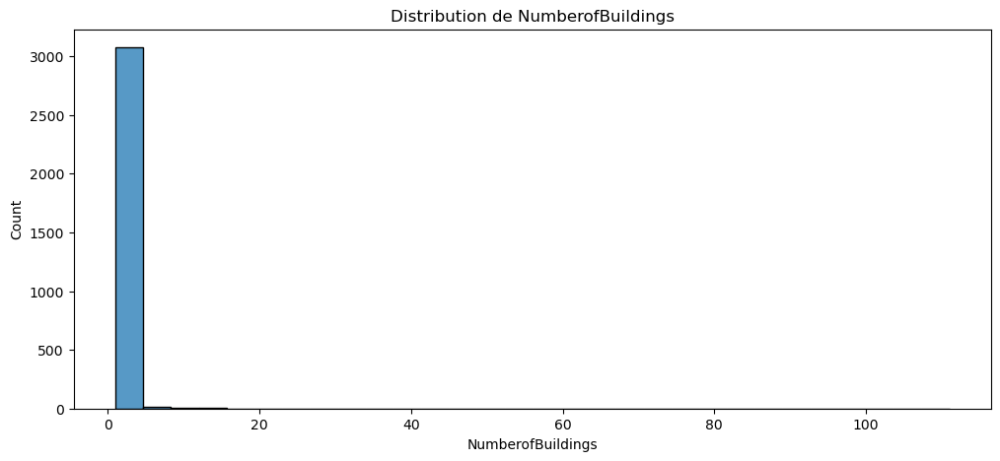

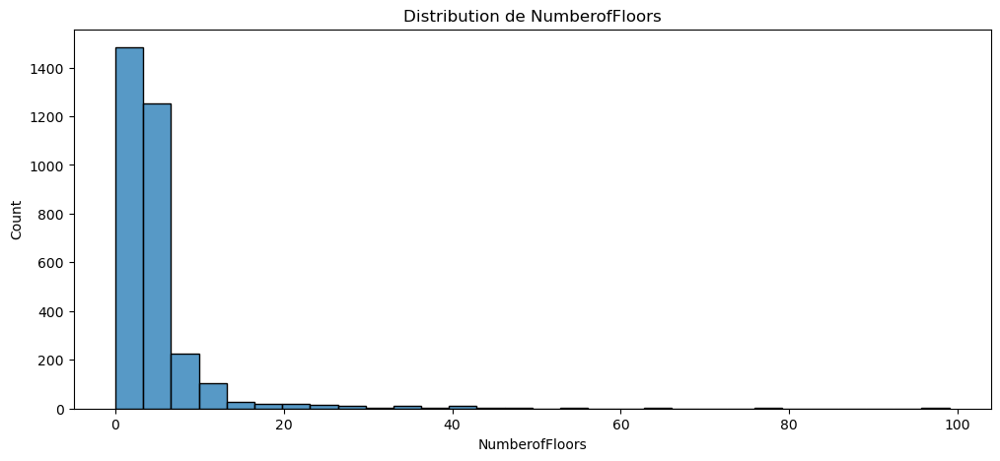

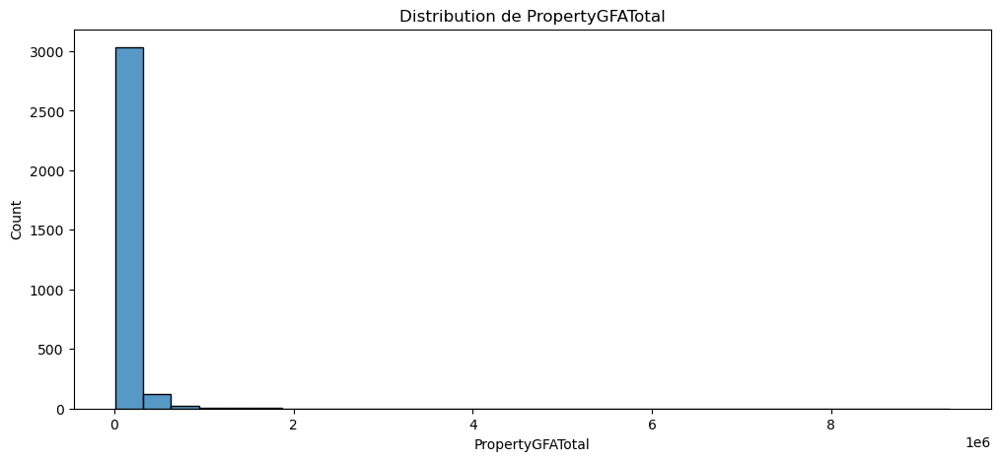

...

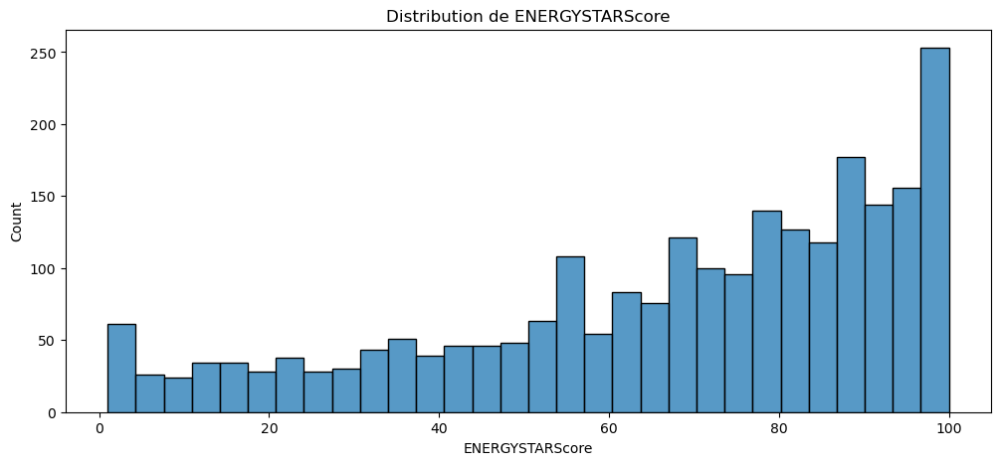

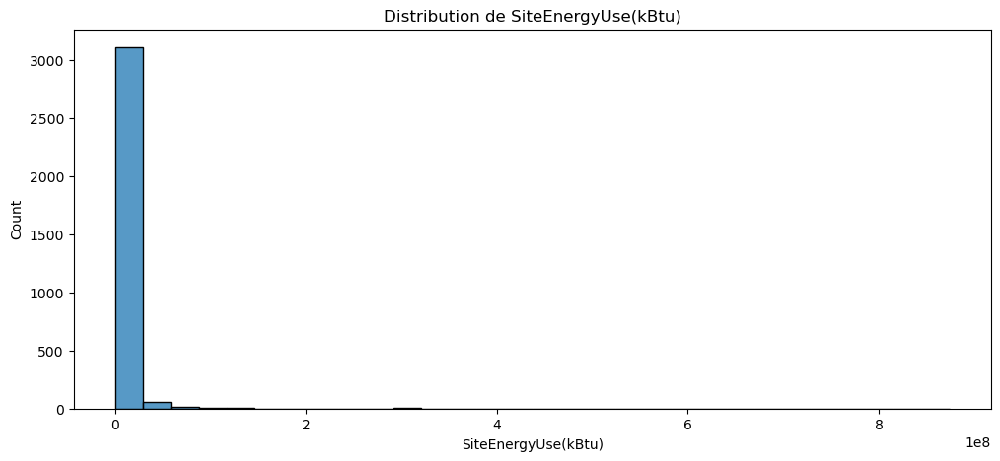

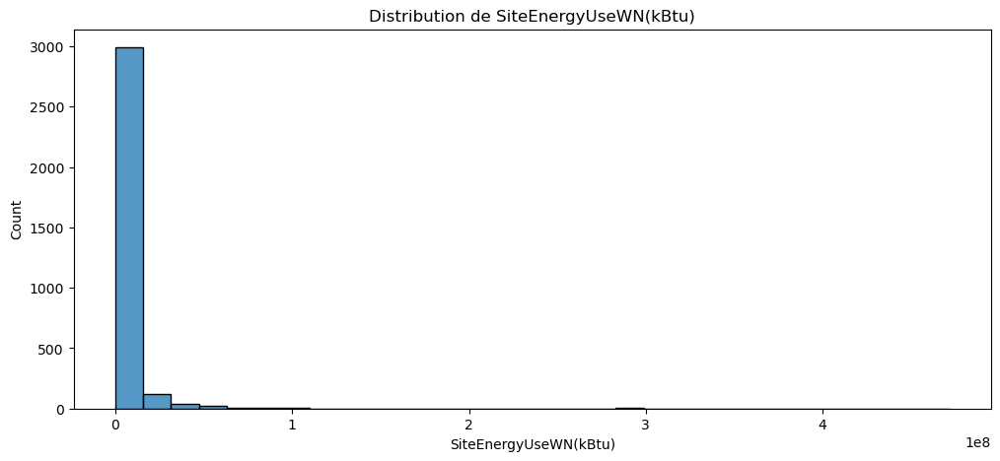

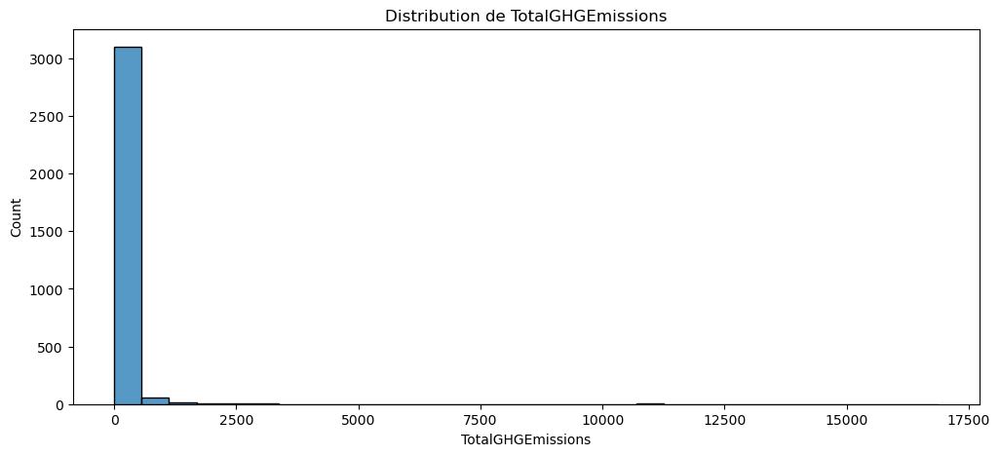

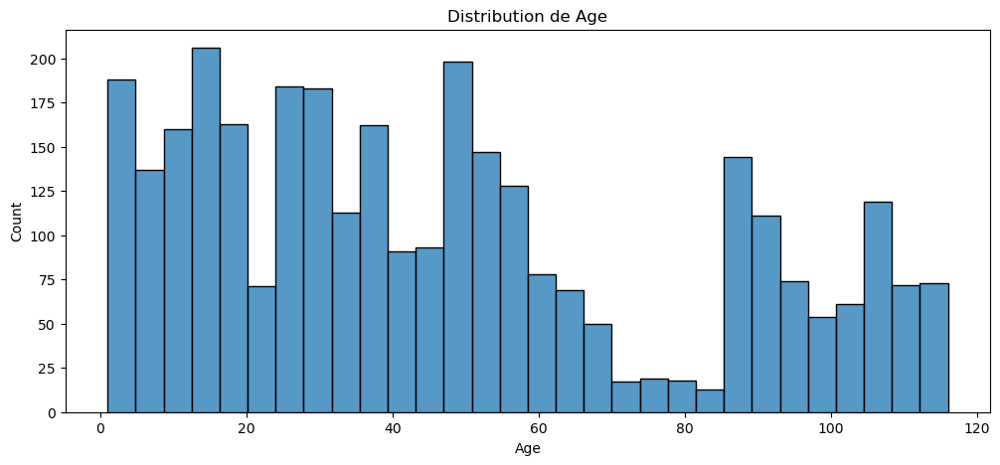

In [114]:
warnings.filterwarnings(action='ignore')
for column in df_cleaned.select_dtypes(np.number).columns:
    plt.figure(figsize=(12,5))
    plt.title('Distribution de ' + column)
    sns.histplot(df_cleaned[column].dropna(), bins=30)

#### <font color='teal'> - 3.5.2 Data target catégorielle</font>

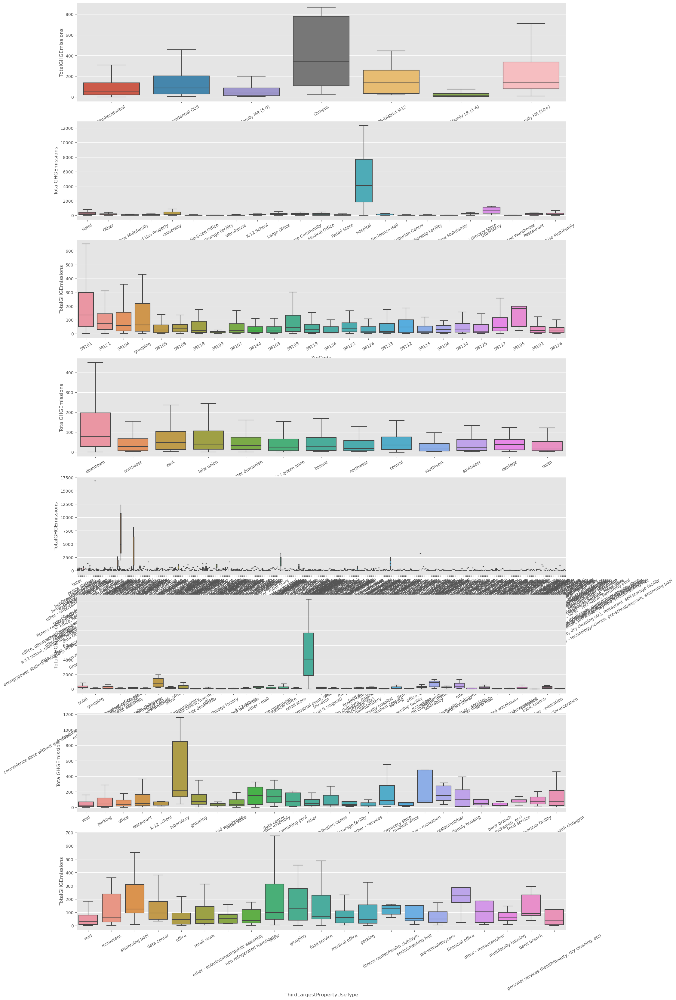

In [115]:
objCol = df_cleaned.select_dtypes(exclude=[np.number]).columns

plt.style.use('ggplot')
fig,axes = plt.subplots(nrows = len(objCol),ncols = 1,figsize=(21,40))
for i,col in enumerate( objCol ):
    g = sns.boxplot(x=col ,y='TotalGHGEmissions',data = df_cleaned,ax=axes[i],showfliers=False)
    g.set_xticklabels(g.get_xticklabels(), rotation=30)
    #axes.flatten()[i-imp].set_title(col)   

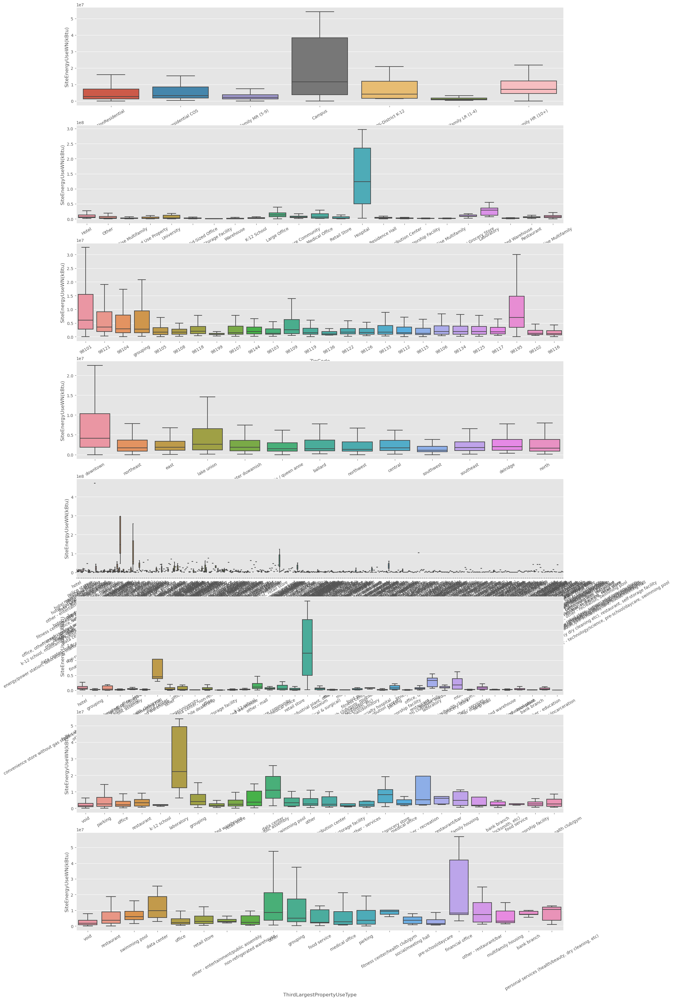

In [116]:
objCol = df_cleaned.select_dtypes(exclude=[np.number]).columns

plt.style.use('ggplot')
fig,axes = plt.subplots(nrows = len(objCol),ncols = 1,figsize=(21,40))
for i,col in enumerate( objCol ):
    h = sns.boxplot(x=col ,y='SiteEnergyUseWN(kBtu)' ,data = df_cleaned,ax=axes[i],showfliers=False)
    h.set_xticklabels(h.get_xticklabels(), rotation=30)
    #axes.flatten()[i-imp].set_title(col)   

### <a name="C36"><font color='teal'>3.6 Normalité</font></a> 

In [117]:
from scipy import stats

numCol = df_cleaned.select_dtypes(include = [np.number]).columns

df_normalite = pd.DataFrame()
list_col = []
list_Shapiro = []
list_log1p_Shapiro = []
list_kstest = []
list_skewness = []

for i,col in enumerate([x for x in numCol]):
    list_col.append(col)
    list_Shapiro.append(stats.shapiro(df_cleaned[col].dropna())[1])
    list_log1p_Shapiro.append(stats.shapiro(np.log1p(df_cleaned[col].dropna()))[1])
    list_kstest.append(stats.kstest(df_cleaned[col].dropna(), 'norm')[1])
    list_skewness.append(stats.skew(df_cleaned[col].dropna()) )
    
df_normalite['Colonne'] = list_col
df_normalite['pvalue_Shapiro'] = list_Shapiro
df_normalite['pvalue_Shapiro log(1+p)'] = list_log1p_Shapiro
df_normalite['pvalue_Kolmogorov-Smirnov'] = list_kstest
df_normalite['skewness_empirique'] = list_skewness

del list_kstest,list_col,list_Shapiro,list_skewness

df_normalite

,Colonne,pvalue_Shapiro,pvalue_Shapiro log(1+p),pvalue_Kolmogorov-Smirnov,skewness_empirique
0,Latitude,3.371299e-22,2.922657e-22,0.0,0.165426
1,Longitude,2.158502e-19,1.000000e+00,0.0,-0.182574
2,NumberofBuildings,0.000000e+00,0.000000e+00,0.0,42.171605
3,NumberofFloors,0.000000e+00,2.306213e-36,0.0,5.851714
4,PropertyGFATotal,0.000000e+00,2.371698e-41,0.0,23.912076
5,PropertyGFAParking,0.000000e+00,0.000000e+00,0.0,6.469055
6,PropertyGFABuilding(s),0.000000e+00,9.761585e-41,0.0,27.431879
7,LargestPropertyUseTypeGFA,0.000000e+00,1.384612e-35,0.0,29.797637
8,SecondLargestPropertyUseTypeGFA,0.000000e+00,0.000000e+00,0.0,6.107203
9,ThirdLargestPropertyUseTypeGFA,0.000000e+00,0.000000e+00,0.0,19.665545


In [118]:
df_normalite.loc[df_normalite['pvalue_Shapiro log(1+p)']>0.05]

,Colonne,pvalue_Shapiro,pvalue_Shapiro log(1+p),pvalue_Kolmogorov-Smirnov,skewness_empirique
1,Longitude,2.158502e-19,1.0,0.0,-0.182574


<div class="alert alert-warning">
Aucune data ne peut etre considérée comme suivant une loi normal même apres une tranformation.
</div>

### <a name="C37"><font color='teal'>3.7 Multi Colinéarité</font></a> 

#### <font color='teal'>3.7.a Matrice de Corrélation</font>

In [119]:
# Etude des correlations
df_cleaned.corr()\
.style.background_gradient(cmap = sns.color_palette("blend:white,green", as_cmap=True),axis=None)\
.format('{:.3f}')

,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,Age
Latitude,1.000,0.016,0.019,-0.030,-0.019,-0.004,-0.020,-0.016,-0.038,-0.050,0.096,-0.024,-0.045,-0.029,-0.127
Longitude,0.016,1.000,0.020,-0.020,0.028,-0.001,0.029,0.031,0.004,0.012,-0.037,0.037,0.035,0.040,0.053
NumberofBuildings,0.019,0.020,1.000,-0.029,0.706,-0.006,0.745,0.769,0.023,-0.000,-0.013,0.698,0.092,0.409,0.025
NumberofFloors,-0.030,-0.020,-0.029,1.000,0.403,0.421,0.359,0.342,0.442,0.204,0.040,0.205,0.292,0.135,-0.148
PropertyGFATotal,-0.019,0.028,0.706,0.403,1.000,0.405,0.990,0.974,0.510,0.268,0.075,0.802,0.402,0.534,-0.099
PropertyGFAParking,-0.004,-0.001,-0.006,0.421,0.405,1.000,0.270,0.303,0.500,0.197,0.058,0.170,0.237,0.088,-0.186
PropertyGFABuilding(s),-0.020,0.029,0.745,0.359,0.990,0.270,1.000,0.979,0.459,0.252,0.071,0.818,0.387,0.549,-0.075
LargestPropertyUseTypeGFA,-0.016,0.031,0.769,0.342,0.974,0.303,0.979,1.000,0.409,0.185,0.063,0.841,0.395,0.581,-0.067
SecondLargestPropertyUseTypeGFA,-0.038,0.004,0.023,0.442,0.510,0.500,0.459,0.409,1.000,0.541,0.094,0.420,0.587,0.434,-0.188
ThirdLargestPropertyUseTypeGFA,-0.050,0.012,-0.000,0.204,0.268,0.197,0.252,0.185,0.541,1.000,0.010,0.334,0.473,0.385,-0.058


Il y a beaucoups de données corrélées.</br>
Simplement car certaines colonnes sont justes des conversion d'autres colonnes en une autre unité. 
</br>
Ex: 1kWh = 1kBtu
suppression une à une

#### <font color='teal'>3.7.b Remove Highly Correlated Features</font>

In [120]:
# Function to list features that are correlated
# Adds the first of the correlated pair only (not both)
def correlatedFeatures(dataset, threshold):
    correlated_columns = set()
    correlations = dataset.corr()
    for i in range(len(correlations)):
        for j in range(i):
            if abs(correlations.iloc[i,j]) > threshold:
                correlated_columns.add(correlations.columns[i]+'_'+correlations.index[j])
    return correlated_columns

In [121]:
# Get a set of correlated features, based on threshold correlation of 0.85
cf = correlatedFeatures(df_cleaned, 0.85)
cf

{'LargestPropertyUseTypeGFA_PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA_PropertyGFATotal',
 'PropertyGFABuilding(s)_PropertyGFATotal',
 'TotalGHGEmissions_SiteEnergyUse(kBtu)',
 'TotalGHGEmissions_SiteEnergyUseWN(kBtu)'}

In [122]:
import scipy
def compute_corr(df):
    """
    Calcul la corrélation entre les colonnes numerique
    retourne un dataset composé de 4 colonnes c1, c2, Corrélation de Pearson Corrélation de Spearman
    """
    df_corr=dict()
    for c1 in df.select_dtypes(include=[np.number]).columns:
        for c2 in df.select_dtypes(include=[np.number]).columns:
            if c1 != c2:
                x = df[[c1,c2]].dropna()[c1].values
                y = df[[c1,c2]].dropna()[c2].values
                df_corr[c1+'_'+c2] = [scipy.stats.pearsonr(x, y)[0] ,
                                   scipy.stats.spearmanr(x, y)[0]]
    result = pd.DataFrame.from_dict(df_corr, orient='index').reset_index()
    result[['Colonne1','Colonne2']] = result['index'].str.split("_",expand=True,)
    result.drop(columns=['index'],inplace=True)
    result.rename(columns={0:'pearson',1:'spearman'},inplace=True)
    
    return result[['Colonne1','Colonne2','pearson','spearman']]

In [123]:
corr_data = compute_corr(df_cleaned)
corr_data.loc[(corr_data.pearson>=0.9) | (corr_data.spearman>=0.9)].sort_values('pearson')

,Colonne1,Colonne2,pearson,spearman
165,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),0.714105,0.985423
179,SiteEnergyUseWN(kBtu),SiteEnergyUse(kBtu),0.714105,0.985423
62,PropertyGFATotal,LargestPropertyUseTypeGFA,0.974131,0.927767
102,LargestPropertyUseTypeGFA,PropertyGFATotal,0.974131,0.927767
90,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.978519,0.925861
104,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.978519,0.925861
61,PropertyGFATotal,PropertyGFABuilding(s),0.989721,0.982996
88,PropertyGFABuilding(s),PropertyGFATotal,0.989721,0.982996


In [124]:
df_cleaned\
.drop(columns=['SiteEnergyUse(kBtu)'],
     inplace=True)

print('Notre dataset est de dimension ',df_cleaned.shape)

Notre dataset est de dimension  (3196, 22)


In [125]:
corr_data = compute_corr(df_cleaned)
corr_data.loc[(corr_data.pearson>=0.95) | (corr_data.spearman>=0.99)].sort_values('pearson')

,Colonne1,Colonne2,pearson,spearman
58,PropertyGFATotal,LargestPropertyUseTypeGFA,0.974131,0.927767
95,LargestPropertyUseTypeGFA,PropertyGFATotal,0.974131,0.927767
84,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.978519,0.925861
97,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.978519,0.925861
57,PropertyGFATotal,PropertyGFABuilding(s),0.989721,0.982996
82,PropertyGFABuilding(s),PropertyGFATotal,0.989721,0.982996


In [126]:
# Etude des correlations
df_cleaned.corr()\
.style.background_gradient(cmap = sns.color_palette("blend:white,green", as_cmap=True),axis=None)\
.format('{:.3f}')

,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Age
Latitude,1.000,0.016,0.019,-0.030,-0.019,-0.004,-0.020,-0.016,-0.038,-0.050,0.096,-0.045,-0.029,-0.127
Longitude,0.016,1.000,0.020,-0.020,0.028,-0.001,0.029,0.031,0.004,0.012,-0.037,0.035,0.040,0.053
NumberofBuildings,0.019,0.020,1.000,-0.029,0.706,-0.006,0.745,0.769,0.023,-0.000,-0.013,0.092,0.409,0.025
NumberofFloors,-0.030,-0.020,-0.029,1.000,0.403,0.421,0.359,0.342,0.442,0.204,0.040,0.292,0.135,-0.148
PropertyGFATotal,-0.019,0.028,0.706,0.403,1.000,0.405,0.990,0.974,0.510,0.268,0.075,0.402,0.534,-0.099
PropertyGFAParking,-0.004,-0.001,-0.006,0.421,0.405,1.000,0.270,0.303,0.500,0.197,0.058,0.237,0.088,-0.186
PropertyGFABuilding(s),-0.020,0.029,0.745,0.359,0.990,0.270,1.000,0.979,0.459,0.252,0.071,0.387,0.549,-0.075
LargestPropertyUseTypeGFA,-0.016,0.031,0.769,0.342,0.974,0.303,0.979,1.000,0.409,0.185,0.063,0.395,0.581,-0.067
SecondLargestPropertyUseTypeGFA,-0.038,0.004,0.023,0.442,0.510,0.500,0.459,0.409,1.000,0.541,0.094,0.587,0.434,-0.188
ThirdLargestPropertyUseTypeGFA,-0.050,0.012,-0.000,0.204,0.268,0.197,0.252,0.185,0.541,1.000,0.010,0.473,0.385,-0.058


In [127]:
df_cleaned.shape

(3196, 22)

# <a name="C4"><font color='green'>**Partie 4 : Cleaning**</font></a> 

In [128]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
LargestPropertyUseTypeGFA,100.00,0
LargestPropertyUseType,100.00,0
ListOfAllPropertyUseTypes,100.00,0
TotalGHGEmissions,100.00,0
PropertyGFABuilding(s),100.00,0


### <a name="C41"><font color='green'>4.1 Imputer Missing Data </font></a> 

In [129]:
#Num
imputerNum = IterativeImputer(max_iter=500, random_state=0)
imputed = imputerNum.fit_transform( df_cleaned.select_dtypes(include=np.number) )
df_numImputed = pd.DataFrame(imputed,index=df_cleaned.index, columns=df_cleaned.select_dtypes(include=np.number).columns)

# Categorical
# pas besoin car pas de valeurs manquantes

# mergeing step
df_cleaned = pd.merge(df_cleaned.select_dtypes(exclude=np.number), df_numImputed, left_index=True, right_index=True) 

In [130]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.0,0
SiteEnergyUseWN(kBtu),100.0,0
ENERGYSTARScore,100.0,0
ThirdLargestPropertyUseTypeGFA,100.0,0
SecondLargestPropertyUseTypeGFA,100.0,0
LargestPropertyUseTypeGFA,100.0,0
PropertyGFABuilding(s),100.0,0
PropertyGFAParking,100.0,0
PropertyGFATotal,100.0,0
NumberofFloors,100.0,0


In [131]:
df_cleaned

,BuildingType,PrimaryPropertyType,ZipCode,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,Latitude,Longitude,...,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Age
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
1,NonResidential,Hotel,98101,downtown,hotel,hotel,void,void,47.61220,-122.33799,...,88434.0,0.0,88434.0,88434.0,0.0,0.0,60.000000,7.456910e+06,249.98,89.0
2,NonResidential,Hotel,98101,downtown,"hotel, parking, restaurant",hotel,parking,restaurant,47.61317,-122.33393,...,103566.0,15064.0,88502.0,83880.0,15064.0,4622.0,61.000000,8.664479e+06,295.86,20.0
3,NonResidential,Hotel,98101,downtown,hotel,hotel,void,void,47.61393,-122.33810,...,956110.0,196718.0,759392.0,756493.0,0.0,0.0,43.000000,7.393711e+07,2089.28,47.0
5,NonResidential,Hotel,98101,downtown,hotel,hotel,void,void,47.61412,-122.33664,...,61320.0,0.0,61320.0,61320.0,0.0,0.0,56.000000,6.946800e+06,286.43,90.0
8,NonResidential,Hotel,98121,downtown,"hotel, parking, swimming pool",hotel,parking,swimming pool,47.61375,-122.34047,...,175580.0,62000.0,113580.0,123445.0,68009.0,0.0,75.000000,1.465650e+07,505.01,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50221,Nonresidential COS,Other,98126,delridge,other - recreation,other - recreation,void,void,47.54067,-122.37441,...,18261.0,0.0,18261.0,18261.0,0.0,0.0,65.984296,1.025432e+06,20.33,34.0
50223,Nonresidential COS,Other,grouping,downtown,other - recreation,other - recreation,void,void,47.59625,-122.32283,...,16000.0,0.0,16000.0,16000.0,0.0,0.0,65.906623,1.053706e+06,32.17,12.0
50224,Nonresidential COS,Other,98119,magnolia / queen anne,"fitness center/health club/gym, other - recrea...",other - recreation,fitness center/health club/gym,swimming pool,47.63644,-122.35784,...,13157.0,0.0,13157.0,7583.0,5574.0,0.0,64.000053,6.053764e+06,223.54,42.0


### <a name="C42"><font color='green'>4.2 Encoding object colonnes (LabelEncoding/OrdinalEncoder/OneHotEncoding)</font></a> 

In [132]:
all_type = dict()
for k in df_cleaned.ListOfAllPropertyUseTypes.str.lower():
    if k is not np.nan:
        for elt in k.split(', '):
            if elt not in all_type:
                all_type[elt] = 1
            else:
                 all_type[elt] += 1

In [133]:
{k: v for k, v in sorted(all_type.items(), key=lambda item: item[1])}

{'police station': 1,
 'energy/power station': 1,
 'single family home': 1,
 'wholesale club/supercenter': 1,
 'enclosed mall': 1,
 'fire station': 1,
 'residential care facility': 1,
 'outpatient rehabilitation/physical therapy': 1,
 'courthouse': 2,
 'vocational school': 2,
 'convenience store without gas station': 3,
 'prison/incarceration': 3,
 'other - utility': 4,
 'movie theater': 4,
 'adult education': 4,
 'other - mall': 5,
 'other/specialty hospital': 6,
 'fast food restaurant': 6,
 'lifestyle center': 6,
 'other - public services': 6,
 'bar/nightclub': 6,
 'other - technology/science': 6,
 'library': 7,
 'automobile dealership': 7,
 'museum': 7,
 'performing arts': 7,
 'urgent care/clinic/other outpatient': 7,
 'strip mall': 8,
 'other - education': 10,
 'repair services (vehicle shoe locksmith etc)': 10,
 'food sales': 11,
 'manufacturing/industrial plant': 12,
 'hospital (general medical & surgical)': 12,
 'other - lodging/residential': 13,
 'personal services (health/beau

In [134]:
df_cleaned_AllUse = df_cleaned.copy()
for key in all_type:
    df_cleaned_AllUse['ListOfAllPropertyUse'+key] = [(x.find(key)!=-1)*1 for x in df_cleaned_AllUse.ListOfAllPropertyUseTypes]

### <a name="C43"><font color='green'>4.3 Export csv</font></a> 

In [135]:
#### data_cleaned without encoding

In [136]:
path_clean = 'data/cleaned/'
filename_clean = 'df_cleaned.csv'
df_cleaned.to_csv(path_clean+filename_clean,index=True,sep=';')

In [137]:
#### data_cleaned with encoding

In [138]:
path_clean = 'data/cleaned/'
filename_clean = 'df_cleaned_AllUse.csv'
df_cleaned_AllUse.to_csv(path_clean+filename_clean,index=True,sep=';')

In [139]:
df_cleaned.head()

,BuildingType,PrimaryPropertyType,ZipCode,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,Latitude,Longitude,...,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Age
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
1,NonResidential,Hotel,98101,downtown,hotel,hotel,void,void,47.61220,-122.33799,...,88434.0,0.0,88434.0,88434.0,0.0,0.0,60.0,7456910.0,249.98,89.0
2,NonResidential,Hotel,98101,downtown,"hotel, parking, restaurant",hotel,parking,restaurant,47.61317,-122.33393,...,103566.0,15064.0,88502.0,83880.0,15064.0,4622.0,61.0,8664479.0,295.86,20.0
3,NonResidential,Hotel,98101,downtown,hotel,hotel,void,void,47.61393,-122.33810,...,956110.0,196718.0,759392.0,756493.0,0.0,0.0,43.0,73937112.0,2089.28,47.0
5,NonResidential,Hotel,98101,downtown,hotel,hotel,void,void,47.61412,-122.33664,...,61320.0,0.0,61320.0,61320.0,0.0,0.0,56.0,6946800.5,286.43,90.0
8,NonResidential,Hotel,98121,downtown,"hotel, parking, swimming pool",hotel,parking,swimming pool,47.61375,-122.34047,...,175580.0,62000.0,113580.0,123445.0,68009.0,0.0,75.0,14656503.0,505.01,36.0


In [140]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.0,0
SiteEnergyUseWN(kBtu),100.0,0
ENERGYSTARScore,100.0,0
ThirdLargestPropertyUseTypeGFA,100.0,0
SecondLargestPropertyUseTypeGFA,100.0,0
LargestPropertyUseTypeGFA,100.0,0
PropertyGFABuilding(s),100.0,0
PropertyGFAParking,100.0,0
PropertyGFATotal,100.0,0
NumberofFloors,100.0,0


</br>

</br>

</br>